# Анализ данных и выбор модели к сервису по прогнозу цен на криптовалюту BTC

# Часть 1. EDA, предобработка данных (пункт аналогичен как с данными nlp)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

In [2]:
import torch
from torch import nn
from torch.utils.data import TensorDataset, DataLoader
from tqdm.notebook import tqdm
from IPython.display import clear_output

In [255]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
import warnings
warnings.filterwarnings("ignore")

#### Выведем датасет - данные с биржи Binance по торговым свечам. Каждая строка с данными - 12 часовая свеча.

#### Столбцы:

 * open_time - Время открытия K-line(свечи)

 * open - Цена открытия

 * high - Макс. цена

 * low	- Мин. цена

 * close - Цена закрытия

  * volume - Объем

  * close_time - Время закрытия

  * quote_volume - Объем котируемых активов

  * count - Количество сделок в рамках свечи

  * taker_buy_volume - Объем базовых активов тейкера в течение этого периода

  * taker_buy_quote_volume - Объем котируемых активов тейкера в течение этого периода

In [4]:
df = pd.read_csv('main_df.csv')

In [5]:
df

,open_time,open,high,low,close,volume,close_time,quote_volume,count,taker_buy_volume,taker_buy_quote_volume
0,2019-09-01,9588.74,9830.00,9520.00,9724.98,19545.404843,2019-09-01 23:59:59.999,1.885133e+08,191324,11545.610598,1.114640e+08
1,2019-09-02,9723.59,10450.00,9712.50,10340.00,44740.248093,2019-09-02 23:59:59.999,4.484622e+08,354155,25140.296125,2.519338e+08
2,2019-09-03,10340.00,10773.00,10272.00,10615.28,47998.376781,2019-09-03 23:59:59.999,5.056177e+08,416076,24734.303264,2.604884e+08
3,2019-09-04,10611.85,10799.00,10369.89,10567.02,43943.889026,2019-09-04 23:59:59.999,4.635265e+08,383457,22244.067656,2.347313e+08
4,2019-09-05,10565.92,10900.00,10450.00,10564.49,33970.960639,2019-09-05 23:59:59.999,3.588613e+08,309846,16535.147807,1.749011e+08
...,...,...,...,...,...,...,...,...,...,...,...
1731,2024-05-28,69436.43,69591.81,67277.91,68398.39,32622.970420,2024-05-28 23:59:59.999,2.224860e+09,1459351,15543.097760,1.059920e+09
1732,2024-05-29,68398.40,68935.68,67124.65,67652.42,23159.831490,2024-05-29 23:59:59.999,1.573095e+09,1221044,11748.559540,7.979284e+08
1733,2024-05-30,67652.41,69500.00,67128.00,68352.17,28478.218400,2024-05-30 23:59:59.999,1.945001e+09,1272851,14074.366550,9.615952e+08
1734,2024-05-31,68352.17,69044.10,66670.00,67540.01,26690.321840,2024-05-31 23:59:59.999,1.812659e+09,1177860,13258.101820,9.004142e+08


Посчитаем основные статистики

In [6]:
df.describe()

,open,high,low,close,volume,quote_volume,count,taker_buy_volume,taker_buy_quote_volume
count,1736.000000,1736.000000,1736.000000,1736.000000,1736.000000,1.736000e+03,1.736000e+03,1736.000000,1.736000e+03
mean,30009.373911,30744.023836,29216.845300,30042.973554,88219.269880,2.294454e+09,1.985449e+06,43642.814948,1.135620e+09
std,17506.291112,17959.124737,16995.454021,17522.916546,92513.003057,2.146180e+09,2.114332e+06,46151.127963,1.069353e+09
min,4800.010000,5365.420000,3782.130000,4800.000000,8837.661330,1.212145e+08,1.913240e+05,4181.991270,6.459779e+07
25%,15320.610000,15752.640000,14780.125000,15438.427500,36969.727296,7.436101e+08,7.743152e+05,18295.244073,3.578319e+08
50%,27648.540000,28168.520000,27132.675000,27681.595000,55238.407233,1.692878e+09,1.255918e+06,27369.648749,8.380509e+08
75%,42601.610000,43475.050000,41671.720000,42661.010000,91041.811240,3.083546e+09,2.100516e+06,44749.516365,1.518118e+09
max,73072.400000,73777.000000,71333.310000,73072.410000,760705.362783,1.746531e+10,1.522359e+07,374775.574085,8.783916e+09


Посмотрим на пропуски:

In [7]:
df.isnull().sum()


open_time                 0
open                      0
high                      0
low                       0
close                     0
volume                    0
close_time                0
quote_volume              0
count                     0
taker_buy_volume          0
taker_buy_quote_volume    0
dtype: int64

Проверим на дубликаты

In [8]:
len(df.index[df.duplicated()])

0

Посмотрим попарные распределения числовых признаков:

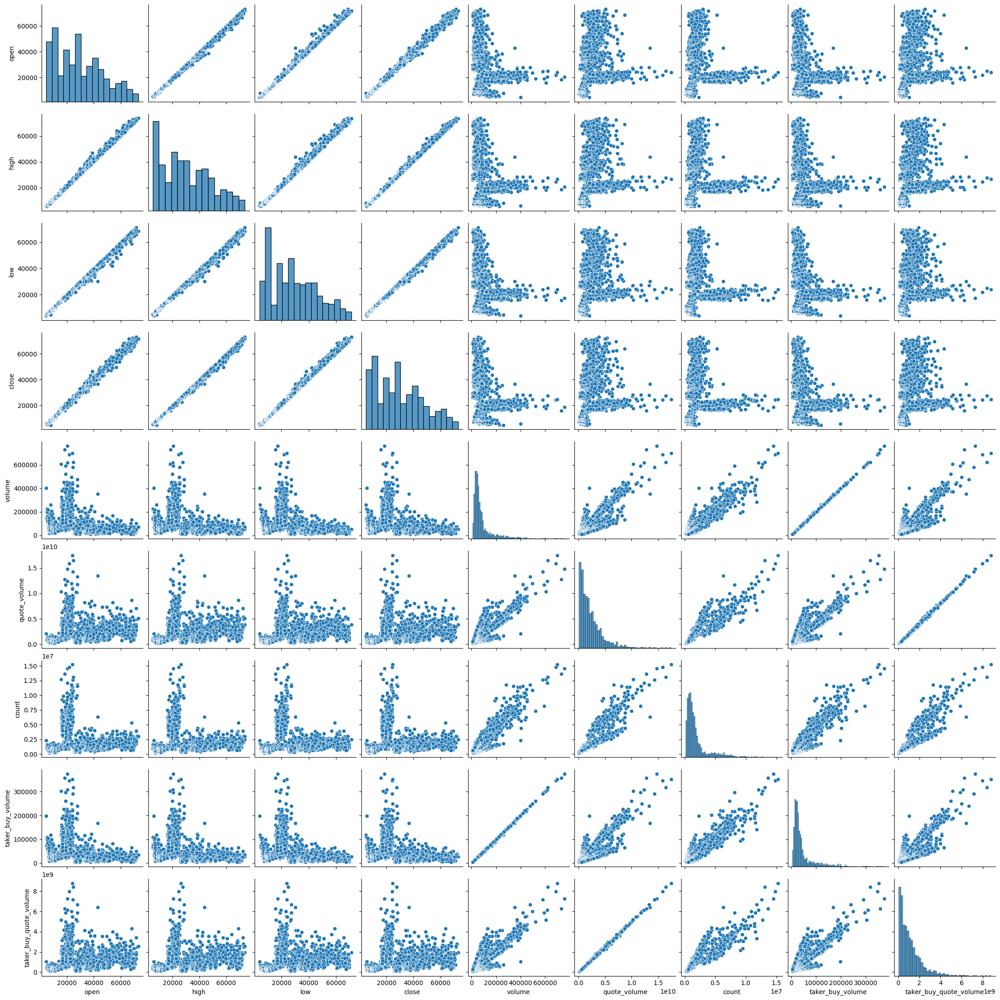

In [9]:
sns.pairplot(df)

Видим, что признаки сделанные из различных уровней цен свечей (high, low, close, open), а также различные виды объема визуально скоррелированы между собой - это логично, так как они все берутся из одной свечи на промежутке 24 часов и в большинстве своем не сильно отличаются друг от друга. Также видим, что volume(объем) кореллирует с count (количеством сделок)

Уберем временные метки

In [10]:
df_wt = df.drop(['open_time', 'close_time'], axis=1)

Построим тепловоую карту попарных корреляций числовых колонок:

<Axes: >

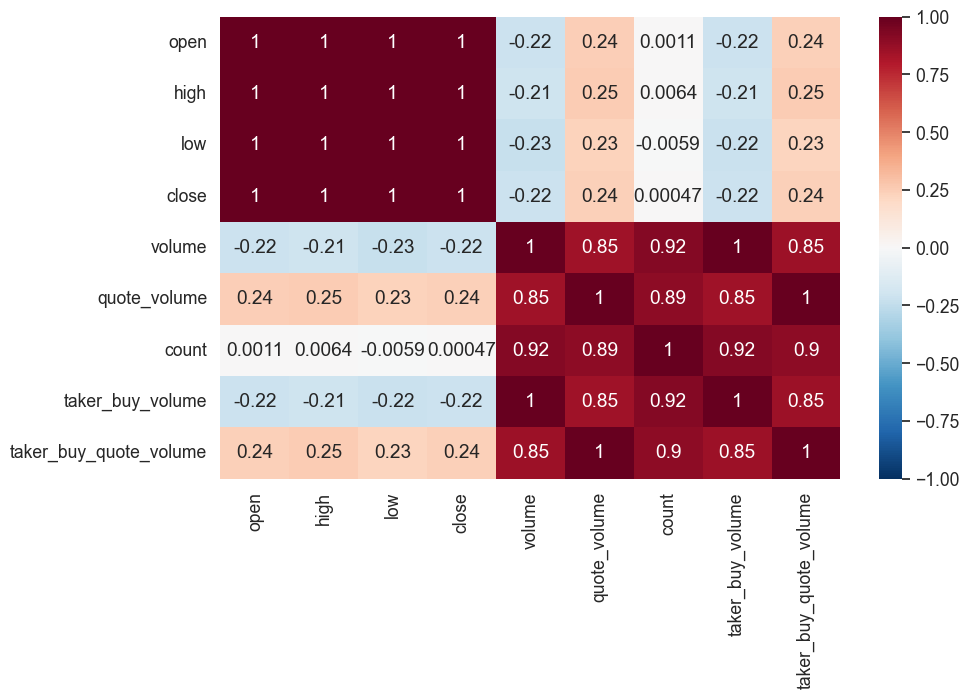

In [11]:
sns.set(font_scale=1.15)
plt.figure(figsize=(10,6))
sns.heatmap(
    df_wt.corr(),        
    cmap='RdBu_r',
    annot=True, 
    vmin=-1, vmax=1)

Еще раз подтверждаем вывод в прошлом пункте

Посмотрим на распределения признаков:

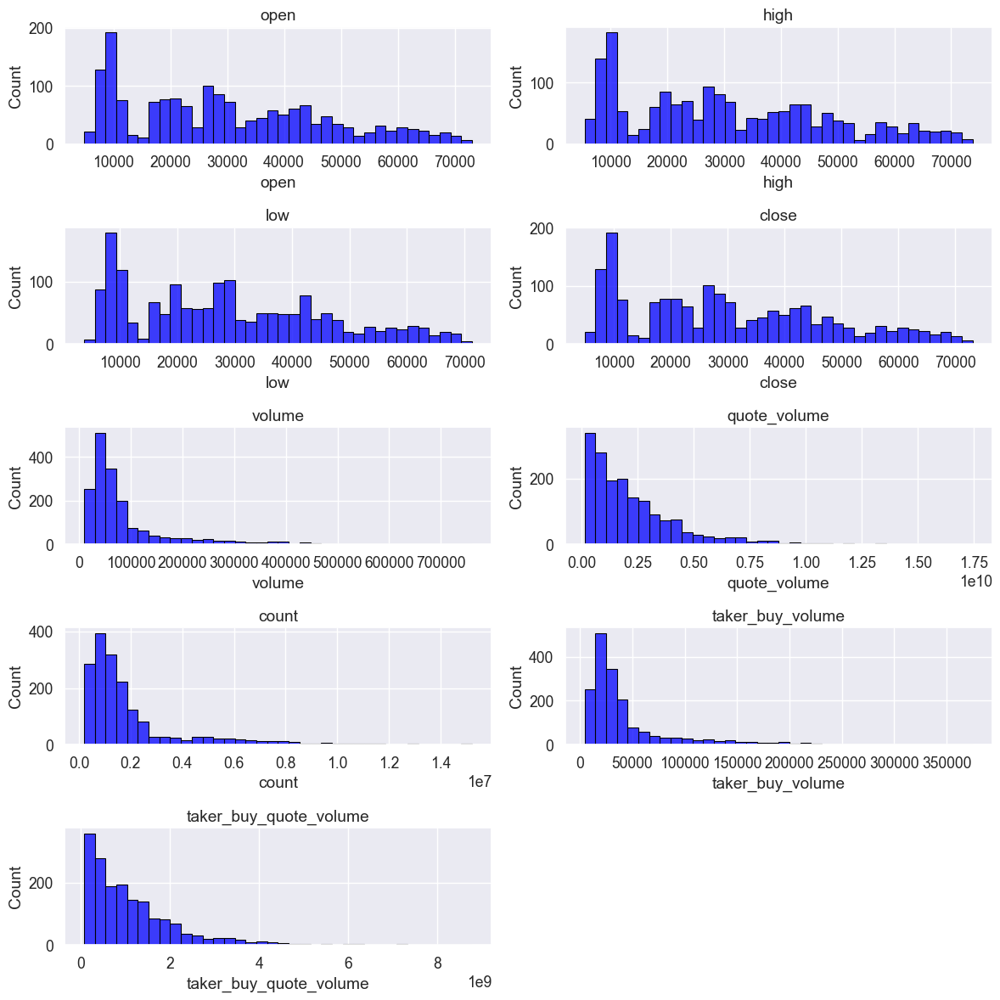

In [12]:
def plot_feat(df):
    num_columns = len(df.columns)
    fig, axes = plt.subplots(nrows=(num_columns + 1) // 2, ncols=2, figsize=(12, 12))  
    axes = axes.flatten()  # Преобразуем в одномерный массив для удобного обращения к каждому графику

    for i, column in enumerate(df.columns):
        sns.histplot(df[column], ax=axes[i], kde=False, bins=int(180/5), color='blue', edgecolor='black')
        axes[i].set_title(column)

    # Отключаем лишние оси, если количество графиков нечётное
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

plot_feat(df_wt)


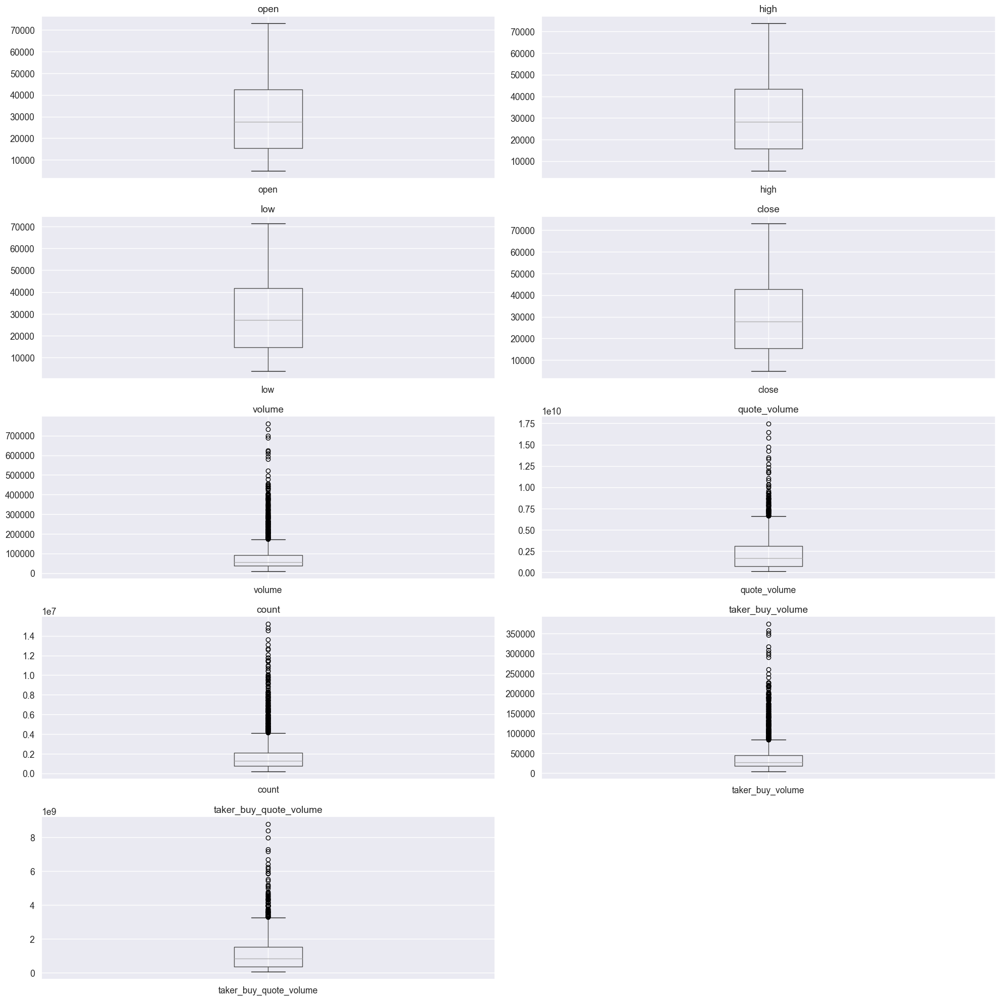

In [13]:
def plot_compact_boxplots(df):
    num_columns = len(df.columns)
    fig, axes = plt.subplots(nrows=(num_columns + 1) // 2, ncols=2, figsize=(20, 20))  
    axes = axes.flatten()  # Преобразуем в одномерный массив для удобного обращения к каждому графику

    for i, column in enumerate(df.columns):
        df.boxplot(column=column, ax=axes[i]) 
        axes[i].set_title(column)

    # Отключаем лишние оси, если количество графиков нечётное
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

plot_compact_boxplots(df_wt)


Удалим выбросы на 0,996 квантиле:

In [14]:
indexes = []
for i in df_wt.columns:
  quan = df_wt[i] > df_wt[i].quantile(0.996)
  indx = quan[quan].index
  for x in indx:
    if x not in indexes:
      indexes.append(x)
    
df_wt.drop(indexes, inplace=True)
df.drop(indexes, inplace=True)

В столбцах volume, quote_volume, count, taker_buy_volume, taker_buy_quote_volume был большой разброс значений, имеет смысл провести логарифмирование этих признаков:

In [15]:
df_wt[['volume', 'quote_volume', 'count', 'taker_buy_volume', 'taker_buy_quote_volume']] = df_wt[['volume', 'quote_volume', 'count', 'taker_buy_volume', 'taker_buy_quote_volume']].apply(np.log)
df[['volume', 'quote_volume', 'count', 'taker_buy_volume', 'taker_buy_quote_volume']] = df[['volume', 'quote_volume', 'count', 'taker_buy_volume', 'taker_buy_quote_volume']].apply(np.log)

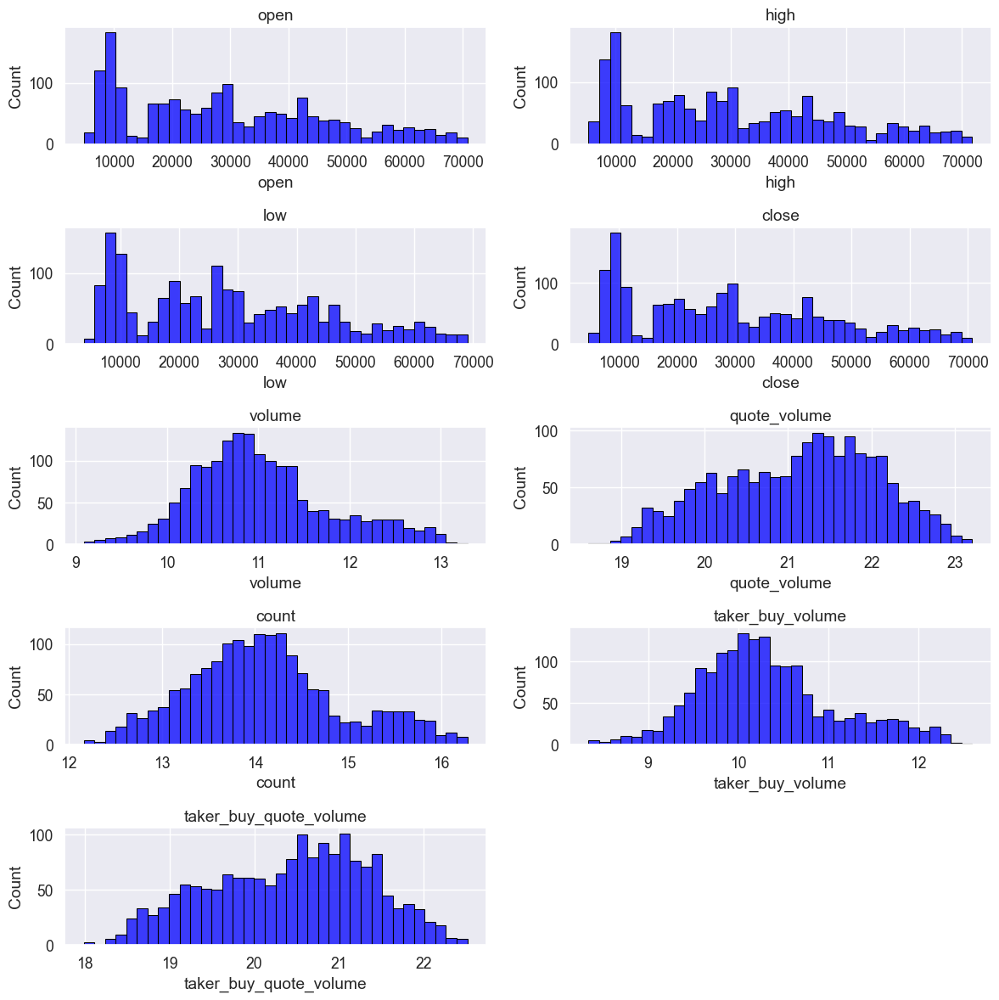

In [16]:
plot_feat(df_wt)


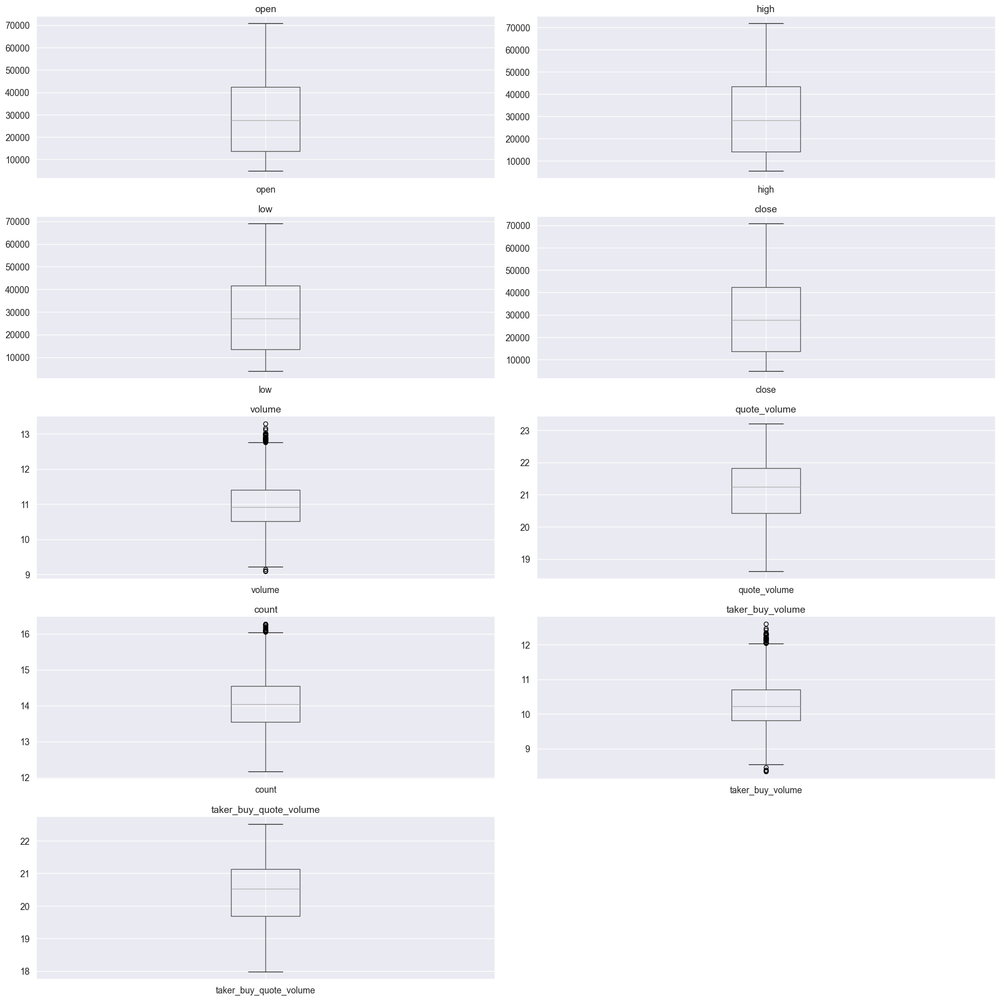

In [17]:
plot_compact_boxplots(df_wt)


Видно, что число выбьросов уменьшилось








# Часть 2. Применение моделей машинного обучения

#### Будем решать задачу классификации цены. А именно у нас есть цена открытия в начале суток (open) и закрытия в конце суток (close), отсюда сформируем бинарную целевую переменную - в каком направлении цена пойдет в конце суток на каждое наблюдение. Предполагается при прогнозировании, что цена открытия нам будет доступна.

In [18]:
df['target'] = np.where(df['open'] < df['close'], 1, 0)

In [19]:
df

,open_time,open,high,low,close,volume,close_time,quote_volume,count,taker_buy_volume,taker_buy_quote_volume,target
0,2019-09-01,9588.74,9830.00,9520.00,9724.98,9.880495,2019-09-01 23:59:59.999,19.054679,12.161724,9.354061,18.529213,1
1,2019-09-02,9723.59,10450.00,9712.50,10340.00,10.708629,2019-09-02 23:59:59.999,19.921335,12.777490,10.132227,19.344677,1
2,2019-09-03,10340.00,10773.00,10272.00,10615.28,10.778922,2019-09-03 23:59:59.999,20.041291,12.938623,10.115946,19.378069,1
3,2019-09-04,10611.85,10799.00,10369.89,10567.02,10.690669,2019-09-04 23:59:59.999,19.954374,12.856983,10.009831,19.273952,0
4,2019-09-05,10565.92,10900.00,10450.00,10564.49,10.433261,2019-09-05 23:59:59.999,19.698447,12.643831,9.713244,18.979731,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1731,2024-05-28,69436.43,69591.81,67277.91,68398.39,10.392772,2024-05-28 23:59:59.999,21.522960,14.193502,9.651372,20.781460,0
1732,2024-05-29,68398.40,68935.68,67124.65,67652.42,10.050175,2024-05-29 23:59:59.999,21.176311,14.015217,9.371486,20.497529,0
1733,2024-05-30,67652.41,69500.00,67128.00,68352.17,10.256895,2024-05-30 23:59:59.999,21.388528,14.056770,9.552110,20.684104,1
1734,2024-05-31,68352.17,69044.10,66670.00,67540.01,10.192056,2024-05-31 23:59:59.999,21.318061,13.979210,9.492364,20.618365,0


In [20]:
# Сделаем копию датасета
df_crypto = df.copy()

#### Сформируем признаки:

In [21]:
# Скользящая средняя цена с окном в 14 наблюдений
df_crypto['moving_average'] = df_crypto['open'].rolling(window=14).mean()

# Скользящая дисперсия цены с окном в 14 наблюдений
df_crypto['moving_variance'] = df_crypto['open'].rolling(window=14).var()

#Разница в цене за сутки
df_crypto['changes'] = df_crypto['open'] - df_crypto['close']

Посмотрим на попарные распределение с новыми признаками:

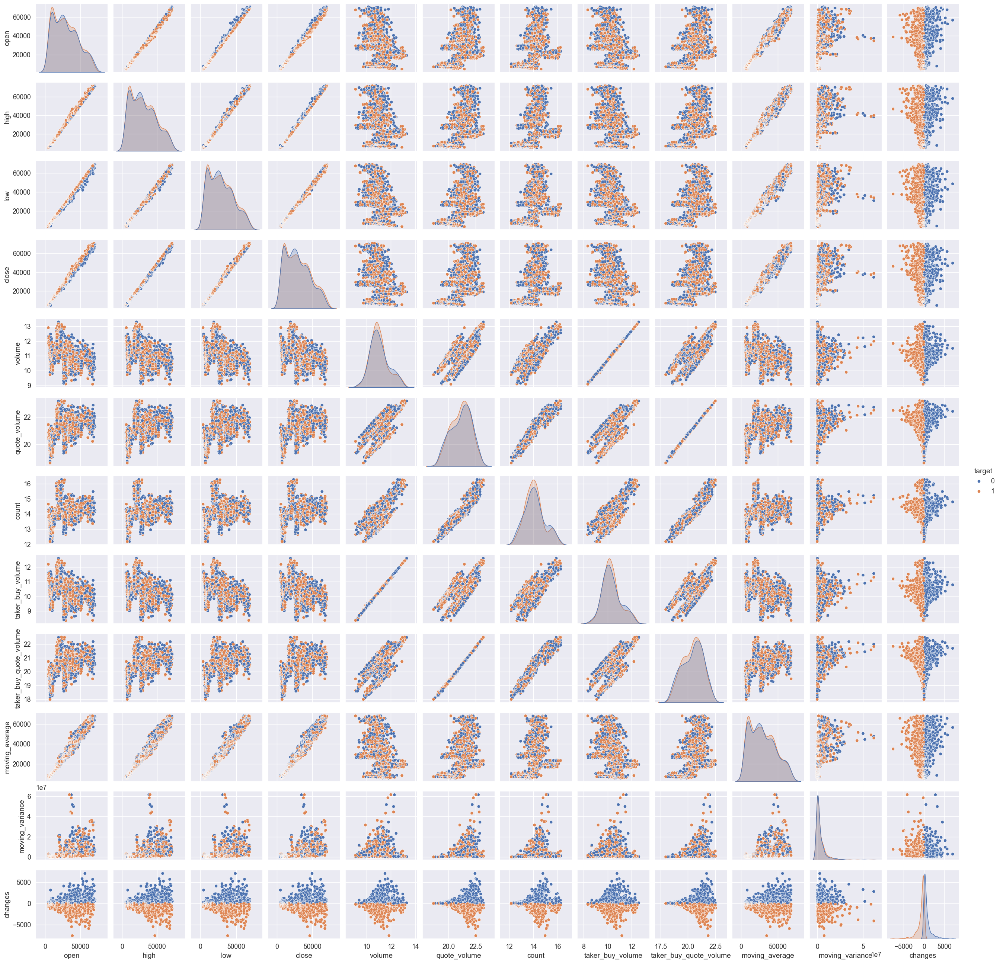

In [22]:
sns.pairplot(df_crypto, hue="target", height=2.2)
plt.show();

#### Так как работа ведется с временным рядом, сформируем лаги (лаговые признаки), возьмем 14 предыдущих:

In [23]:
columns = {'close': 'lag_close'}

for col, prefix in columns.items():
    for i in range(1, 15):
        df_crypto[f"{prefix}{i}"] = df_crypto[col].shift(i)


In [28]:
df_crypto['changes_lag_1'] = df_crypto['changes'].shift(1)

In [29]:
pd.set_option('display.max_columns', None)

In [31]:
df_crypto

,open_time,open,high,low,close,volume,close_time,quote_volume,count,taker_buy_volume,taker_buy_quote_volume,target,moving_average,moving_variance,changes,lag_close1,lag_close2,lag_close3,lag_close4,lag_close5,lag_close6,lag_close7,lag_close8,lag_close9,lag_close10,lag_close11,lag_close12,lag_close13,lag_close14,changes_lag_1
0,2019-09-01,9588.74,9830.00,9520.00,9724.98,9.880495,2019-09-01 23:59:59.999,19.054679,12.161724,9.354061,18.529213,1,NaN,NaN,-136.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-09-02,9723.59,10450.00,9712.50,10340.00,10.708629,2019-09-02 23:59:59.999,19.921335,12.777490,10.132227,19.344677,1,NaN,NaN,-616.41,9724.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-136.24
2,2019-09-03,10340.00,10773.00,10272.00,10615.28,10.778922,2019-09-03 23:59:59.999,20.041291,12.938623,10.115946,19.378069,1,NaN,NaN,-275.28,10340.00,9724.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-616.41
3,2019-09-04,10611.85,10799.00,10369.89,10567.02,10.690669,2019-09-04 23:59:59.999,19.954374,12.856983,10.009831,19.273952,0,NaN,NaN,44.83,10615.28,10340.00,9724.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-275.28
4,2019-09-05,10565.92,10900.00,10450.00,10564.49,10.433261,2019-09-05 23:59:59.999,19.698447,12.643831,9.713244,18.979731,0,NaN,NaN,1.43,10567.02,10615.28,10340.00,9724.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1731,2024-05-28,69436.43,69591.81,67277.91,68398.39,10.392772,2024-05-28 23:59:59.999,21.522960,14.193502,9.651372,20.781460,0,66746.555000,8.505404e+06,1038.04,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,62940.08,61483.99,-928.76
1732,2024-05-29,68398.40,68935.68,67124.65,67652.42,10.050175,2024-05-29 23:59:59.999,21.176311,14.015217,9.371486,20.497529,0,67240.440714,6.322265e+06,745.98,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,62940.08,1038.04
1733,2024-05-30,67652.41,69500.00,67128.00,68352.17,10.256895,2024-05-30 23:59:59.999,21.388528,14.056770,9.552110,20.684104,1,67577.035000,4.790769e+06,-699.76,67652.42,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,745.98
1734,2024-05-31,68352.17,69044.10,66670.00,67540.01,10.192056,2024-05-31 23:59:59.999,21.318061,13.979210,9.492364,20.618365,0,68060.940714,1.815999e+06,812.16,68352.17,67652.42,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,-699.76


In [32]:
df_crypto.isnull().sum()


open_time                  0
open                       0
high                       0
low                        0
close                      0
volume                     0
close_time                 0
quote_volume               0
count                      0
taker_buy_volume           0
taker_buy_quote_volume     0
target                     0
moving_average            13
moving_variance           13
changes                    0
lag_close1                 1
lag_close2                 2
lag_close3                 3
lag_close4                 4
lag_close5                 5
lag_close6                 6
lag_close7                 7
lag_close8                 8
lag_close9                 9
lag_close10               10
lag_close11               11
lag_close12               12
lag_close13               13
lag_close14               14
changes_lag_1              1
dtype: int64

Удалим строки с NaN:

In [33]:
df_crypto.dropna(inplace=True)


In [34]:
df_crypto.isnull().sum()


open_time                 0
open                      0
high                      0
low                       0
close                     0
volume                    0
close_time                0
quote_volume              0
count                     0
taker_buy_volume          0
taker_buy_quote_volume    0
target                    0
moving_average            0
moving_variance           0
changes                   0
lag_close1                0
lag_close2                0
lag_close3                0
lag_close4                0
lag_close5                0
lag_close6                0
lag_close7                0
lag_close8                0
lag_close9                0
lag_close10               0
lag_close11               0
lag_close12               0
lag_close13               0
lag_close14               0
changes_lag_1             0
dtype: int64

За целевую переменную возьмем бинарную переменную движения цены на конец суток (1 - вверх / 0 - вниз) - столбец target .  
Удалим неиспользуемы столбцы. Оставим только: open_time, changes_lag_1, lag_close_1-14

In [36]:
df_crypto.drop([ 'close_time', 'high', 'low', 'taker_buy_volume', 'changes', 'taker_buy_quote_volume', 'quote_volume', 'volume','count' ], axis=1, inplace=True)


In [37]:
df_crypto

,open_time,open,close,target,moving_average,moving_variance,lag_close1,lag_close2,lag_close3,lag_close4,lag_close5,lag_close6,lag_close7,lag_close8,lag_close9,lag_close10,lag_close11,lag_close12,lag_close13,lag_close14,changes_lag_1
14,2019-09-15,10332.81,10302.01,0,10327.986429,5.137904e+04,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,10340.00,9724.98,9.11
15,2019-09-16,10303.34,10251.31,0,10369.397143,2.147939e+04,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,10340.00,30.80
16,2019-09-17,10249.68,10187.82,0,10362.945714,2.247057e+04,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,52.03
17,2019-09-18,10187.48,10156.99,0,10332.633571,1.908375e+04,10187.82,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,61.86
18,2019-09-19,10156.41,10244.29,1,10303.382857,1.636480e+04,10156.99,10187.82,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,30.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1731,2024-05-28,69436.43,68398.39,0,66746.555000,8.505404e+06,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,62940.08,61483.99,-928.76
1732,2024-05-29,68398.40,67652.42,0,67240.440714,6.322265e+06,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,62940.08,1038.04
1733,2024-05-30,67652.41,68352.17,1,67577.035000,4.790769e+06,67652.42,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,745.98
1734,2024-05-31,68352.17,67540.01,0,68060.940714,1.815999e+06,68352.17,67652.42,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,-699.76


Возьмем за индексацию датасета цену открытия

In [38]:
df_crypto.set_index('open_time', inplace=True)


In [45]:
df_crypto

,open,close,target,moving_average,moving_variance,lag_close1,lag_close2,lag_close3,lag_close4,lag_close5,lag_close6,lag_close7,lag_close8,lag_close9,lag_close10,lag_close11,lag_close12,lag_close13,lag_close14,changes_lag_1
open_time,,,,,,,,,,,,,,,,,,,,
2019-09-15,10332.81,10302.01,0,10327.986429,5.137904e+04,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,10340.00,9724.98,9.11
2019-09-16,10303.34,10251.31,0,10369.397143,2.147939e+04,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,10340.00,30.80
2019-09-17,10249.68,10187.82,0,10362.945714,2.247057e+04,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,52.03
2019-09-18,10187.48,10156.99,0,10332.633571,1.908375e+04,10187.82,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,61.86
2019-09-19,10156.41,10244.29,1,10303.382857,1.636480e+04,10156.99,10187.82,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,30.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-28,69436.43,68398.39,0,66746.555000,8.505404e+06,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,62940.08,61483.99,-928.76
2024-05-29,68398.40,67652.42,0,67240.440714,6.322265e+06,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,62940.08,1038.04
2024-05-30,67652.41,68352.17,1,67577.035000,4.790769e+06,67652.42,68398.39,69436.43,68507.67,69290.57,68549.99,67969.65,69166.62,66274.01,66915.20,67024.00,65235.21,66206.50,61577.49,745.98


Разобьем выборку на train и test:

In [349]:
Train = df_crypto.loc['2019-09-15':'2024-04-30']
Test = df_crypto.loc['2024-05-01':'2024-06-01']

Train.shape, Test.shape

((1668, 20), (30, 20))

Уберем close и target из трен. выборки:

In [350]:
X_train = Train.drop(['close', 'target'], axis=1)
y_train = Train['target']

X_test = Test.drop(['close', 'target'], axis=1)
y_test = Test['target']

In [279]:
X_train

,open,moving_average,moving_variance,lag_close1,lag_close2,lag_close3,lag_close4,lag_close5,lag_close6,lag_close7,lag_close8,lag_close9,lag_close10,lag_close11,lag_close12,lag_close13,lag_close14,changes_lag_1
open_time,,,,,,,,,,,,,,,,,,
2019-09-15,10332.81,10327.986429,5.137904e+04,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,10340.00,9724.98,9.11
2019-09-16,10303.34,10369.397143,2.147939e+04,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,10340.00,30.80
2019-09-17,10249.68,10362.945714,2.247057e+04,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,10615.28,52.03
2019-09-18,10187.48,10332.633571,1.908375e+04,10187.82,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,10567.02,61.86
2019-09-19,10156.41,10303.382857,1.636480e+04,10156.99,10187.82,10251.31,10302.01,10335.02,10342.06,10415.01,10158.33,10098.15,10303.12,10381.18,10455.88,10298.73,10564.49,30.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-26,64498.33,64598.908571,2.418673e+06,64498.34,64289.59,66414.00,66819.32,64941.15,64940.59,63818.01,63470.08,61277.37,63793.39,63419.99,65661.84,63924.51,67116.52,-208.76
2024-04-27,63770.00,64359.871429,1.922425e+06,63770.01,64498.34,64289.59,66414.00,66819.32,64941.15,64940.59,63818.01,63470.08,61277.37,63793.39,63419.99,65661.84,63924.51,728.32
2024-04-28,63461.98,64326.832857,1.968686e+06,63461.98,63770.01,64498.34,64289.59,66414.00,66819.32,64941.15,64940.59,63818.01,63470.08,61277.37,63793.39,63419.99,65661.84,308.02


Распределение классов целевой переменной на тренировочной и тестовой выборке

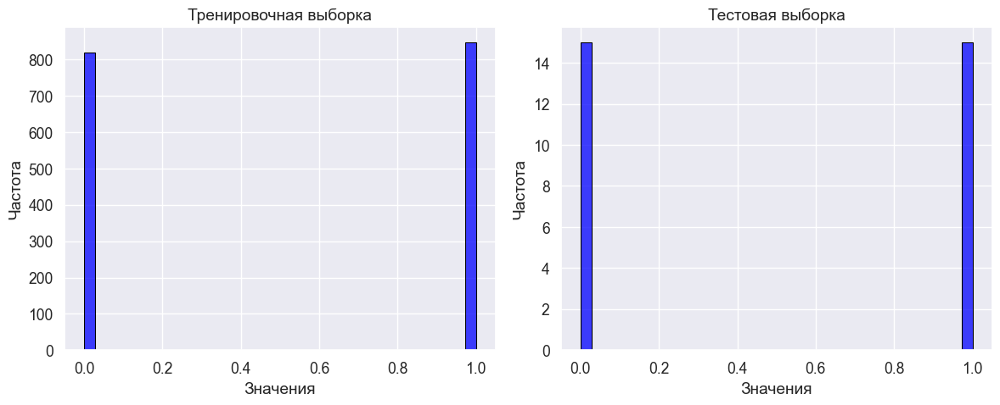

In [46]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(y_train, bins=int(180/5), color='blue', edgecolor='black', ax=axes[0])
axes[0].set_title('Тренировочная выборка')
axes[0].set_xlabel('Значения')
axes[0].set_ylabel('Частота')


sns.histplot(y_test, bins=int(180/5), color='blue', edgecolor='black', ax=axes[1])
axes[1].set_title('Тестовая выборка')
axes[1].set_xlabel('Значения')
axes[1].set_ylabel('Частота')

plt.tight_layout()
plt.show()



Видно, что классы на трен. выборке практически сбалансированы, а на тестовой сбалансированы полностью

### Применение алгоритма логистической регрессии

In [47]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn import preprocessing
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.metrics import make_scorer

 ##### Обучим со стандартизацией:

Преобразуем тренировочные и тестовые данные  перед подачей в модели:

In [48]:
scaler = preprocessing.StandardScaler()

In [49]:
scaler_train = scaler.fit_transform(X_train)
scaler_test = scaler.transform(X_test)

Сформируем сетку для подбора параметров:

In [50]:
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 200, 300, 400, 500]
}

Используем метод TimeSeriesSplit  для обеспечения корректного разбиения временных данных на обучающие и тестовые наборы при кросс-валидации, учитывая последовательную структуру временных данных:

In [51]:
tscv = TimeSeriesSplit(n_splits=5)

In [52]:
model = LogisticRegression()
scorer = make_scorer(accuracy_score, greater_is_better=True)

grid_logreg = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring=scorer, n_jobs=-1)
grid_logreg.fit(scaler_train, y_train)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'max_iter': [100, 200, 300, 400, 500],
                         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring=make_scorer(accuracy_score, response_method='predict'))

In [53]:
print("Best params:", grid_logreg.best_params_)


Best params: {'C': 100, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [54]:
y_test_pred = grid_logreg.predict(scaler_test)
y_train_pred = grid_logreg.predict(scaler_train)

In [55]:
print("Train Set Metrics:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_train, grid_logreg.predict_proba(scaler_train)[:, 1]))

print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_test, grid_logreg.predict_proba(scaler_test)[:, 1]))


Train Set Metrics:
Accuracy: 0.5551558752997602
Precision: 0.5574912542529732
Recall: 0.5551558752997602
F1 Score: 0.5454355677650495
roc_auc:  0.575780890473999

Test Set Metrics:
Accuracy: 0.4666666666666667
Precision: 0.4666666666666667
Recall: 0.4666666666666667
F1 Score: 0.4666666666666667
roc_auc:  0.4622222222222222


 ##### Обучим без стандартизации:

In [56]:
grid_logreg = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring=scorer, n_jobs=-1)
grid_logreg.fit(X_train, y_train)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'max_iter': [100, 200, 300, 400, 500],
                         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring=make_scorer(accuracy_score, response_method='predict'))

In [57]:
print("Best params:", grid_logreg.best_params_)

Best params: {'C': 0.1, 'max_iter': 400, 'penalty': 'l1', 'solver': 'liblinear'}


In [58]:
y_test_pred = grid_logreg.predict(X_test)
y_train_pred = grid_logreg.predict(X_train)

In [59]:
print("Train Set Metrics:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_train, grid_logreg.predict_proba(X_train)[:, 1]))

print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_test, grid_logreg.predict_proba(X_test)[:, 1]))

Train Set Metrics:
Accuracy: 0.5629496402877698
Precision: 0.5631019564160477
Recall: 0.5629496402877698
F1 Score: 0.5629802740531497
roc_auc:  0.5798823630924989

Test Set Metrics:
Accuracy: 0.43333333333333335
Precision: 0.4305555555555555
Recall: 0.43333333333333335
F1 Score: 0.4276094276094276
roc_auc:  0.4488888888888889


Видим, что результаты  лучше на данных без стандартизации

### Применение алгоритмов градиентного бустинга

### CatBoost

In [60]:
from catboost import CatBoostClassifier

In [61]:
model = CatBoostClassifier(random_state=42)

 ##### Обучим со стандартизацией:

In [62]:
param_grid = {
	'iterations': [1000, 2000, 3000],
	'learning_rate': [0.1, 0.01, 0.001],
	'depth': [2, 4, 6]
}

scorer = make_scorer(accuracy_score, greater_is_better=True)
tscv = TimeSeriesSplit(n_splits=5)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring=scorer, n_jobs=-1)
grid_search.fit(scaler_train, y_train)


print("Grid Search - Best Hyperparameters:", grid_search.best_params_)


0:	learn: 0.6931206	total: 150ms	remaining: 7m 30s
1:	learn: 0.6930978	total: 152ms	remaining: 3m 48s
2:	learn: 0.6930795	total: 154ms	remaining: 2m 33s
3:	learn: 0.6930397	total: 156ms	remaining: 1m 56s
4:	learn: 0.6930098	total: 157ms	remaining: 1m 34s
5:	learn: 0.6929828	total: 158ms	remaining: 1m 19s
6:	learn: 0.6929550	total: 160ms	remaining: 1m 8s
7:	learn: 0.6929318	total: 161ms	remaining: 1m
8:	learn: 0.6929070	total: 163ms	remaining: 54s
9:	learn: 0.6928862	total: 164ms	remaining: 49s
10:	learn: 0.6928585	total: 165ms	remaining: 44.9s
11:	learn: 0.6928295	total: 166ms	remaining: 41.5s
12:	learn: 0.6928092	total: 168ms	remaining: 38.5s
13:	learn: 0.6927961	total: 169ms	remaining: 36.1s
14:	learn: 0.6927714	total: 170ms	remaining: 33.9s
15:	learn: 0.6927502	total: 172ms	remaining: 32s
16:	learn: 0.6927263	total: 173ms	remaining: 30.4s
17:	learn: 0.6927053	total: 174ms	remaining: 28.9s
18:	learn: 0.6926843	total: 176ms	remaining: 27.6s
19:	learn: 0.6926633	total: 177ms	remaining:

Обучим модель с лучшими гиперпараметрами:

In [68]:
clf_model = CatBoostClassifier(iterations=3000,  depth=6 ,learning_rate=0.001 )

In [69]:
clf_model.fit(scaler_train, y_train)

0:	learn: 0.6931161	total: 2.41ms	remaining: 7.24s
1:	learn: 0.6931009	total: 4.32ms	remaining: 6.47s
2:	learn: 0.6930718	total: 5.77ms	remaining: 5.77s
3:	learn: 0.6930579	total: 7.27ms	remaining: 5.45s
4:	learn: 0.6930464	total: 8.58ms	remaining: 5.14s
5:	learn: 0.6930257	total: 10.1ms	remaining: 5.03s
6:	learn: 0.6929993	total: 11.6ms	remaining: 4.95s
7:	learn: 0.6929715	total: 13.1ms	remaining: 4.89s
8:	learn: 0.6929498	total: 14.6ms	remaining: 4.84s
9:	learn: 0.6929322	total: 16ms	remaining: 4.79s
10:	learn: 0.6929159	total: 17.4ms	remaining: 4.74s
11:	learn: 0.6928955	total: 18.8ms	remaining: 4.69s
12:	learn: 0.6928575	total: 20.2ms	remaining: 4.64s
13:	learn: 0.6928377	total: 21.5ms	remaining: 4.58s
14:	learn: 0.6928131	total: 23.1ms	remaining: 4.6s
15:	learn: 0.6927970	total: 24.6ms	remaining: 4.58s
16:	learn: 0.6927685	total: 26.2ms	remaining: 4.6s
17:	learn: 0.6927443	total: 27.8ms	remaining: 4.6s
18:	learn: 0.6927169	total: 29.3ms	remaining: 4.59s
19:	learn: 0.6926884	total:

In [70]:
y_test_pred = clf_model.predict(scaler_test)
y_train_pred = clf_model.predict(scaler_train)

In [71]:
print("Train Set Metrics:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_train, clf_model.predict_proba(scaler_train)[:, 1]))

print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_test, clf_model.predict_proba(scaler_test)[:, 1]))


Train Set Metrics:
Accuracy: 0.6786570743405276
Precision: 0.6787716771742708
Recall: 0.6786570743405276
F1 Score: 0.6786792521088292
roc_auc:  0.7640243902439025

Test Set Metrics:
Accuracy: 0.5666666666666667
Precision: 0.5669642857142857
Recall: 0.5666666666666667
F1 Score: 0.5661846496106785
roc_auc:  0.6222222222222222


 ##### Обучим без стандартизации:

In [67]:
scorer = make_scorer(accuracy_score, greater_is_better=True)
tscv = TimeSeriesSplit(n_splits=5)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring=scorer, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Grid Search - Best Hyperparameters:", grid_search.best_params_)

0:	learn: 0.6931206	total: 2.28ms	remaining: 6.85s
1:	learn: 0.6930978	total: 3.92ms	remaining: 5.88s
2:	learn: 0.6930795	total: 5.56ms	remaining: 5.55s
3:	learn: 0.6930397	total: 7.38ms	remaining: 5.53s
4:	learn: 0.6930098	total: 8.86ms	remaining: 5.3s
5:	learn: 0.6929828	total: 10.5ms	remaining: 5.23s
6:	learn: 0.6929550	total: 12.4ms	remaining: 5.32s
7:	learn: 0.6929318	total: 14.2ms	remaining: 5.3s
8:	learn: 0.6929070	total: 15.8ms	remaining: 5.26s
9:	learn: 0.6928862	total: 17.4ms	remaining: 5.21s
10:	learn: 0.6928585	total: 19.1ms	remaining: 5.19s
11:	learn: 0.6928295	total: 20.7ms	remaining: 5.15s
12:	learn: 0.6928092	total: 22.4ms	remaining: 5.14s
13:	learn: 0.6927961	total: 24ms	remaining: 5.13s
14:	learn: 0.6927714	total: 25.6ms	remaining: 5.09s
15:	learn: 0.6927502	total: 27ms	remaining: 5.04s
16:	learn: 0.6927263	total: 28.4ms	remaining: 4.99s
17:	learn: 0.6927053	total: 29.8ms	remaining: 4.93s
18:	learn: 0.6926843	total: 31.1ms	remaining: 4.89s
19:	learn: 0.6926633	total: 

In [76]:
clf_model = CatBoostClassifier(iterations=3000,  depth=6 ,learning_rate=0.001 )

In [77]:
clf_model.fit(X_train, y_train)

0:	learn: 0.6931161	total: 2.06ms	remaining: 6.19s
1:	learn: 0.6931009	total: 3.98ms	remaining: 5.96s
2:	learn: 0.6930718	total: 5.68ms	remaining: 5.67s
3:	learn: 0.6930579	total: 7.29ms	remaining: 5.46s
4:	learn: 0.6930464	total: 8.93ms	remaining: 5.35s
5:	learn: 0.6930257	total: 10.7ms	remaining: 5.32s
6:	learn: 0.6929993	total: 12.4ms	remaining: 5.32s
7:	learn: 0.6929715	total: 14.3ms	remaining: 5.35s
8:	learn: 0.6929498	total: 16.3ms	remaining: 5.41s
9:	learn: 0.6929322	total: 18.1ms	remaining: 5.4s
10:	learn: 0.6929159	total: 19.7ms	remaining: 5.35s
11:	learn: 0.6928955	total: 21.4ms	remaining: 5.32s
12:	learn: 0.6928575	total: 22.9ms	remaining: 5.26s
13:	learn: 0.6928377	total: 24.4ms	remaining: 5.21s
14:	learn: 0.6928131	total: 25.9ms	remaining: 5.14s
15:	learn: 0.6927970	total: 27.1ms	remaining: 5.05s
16:	learn: 0.6927685	total: 28.3ms	remaining: 4.96s
17:	learn: 0.6927443	total: 29.5ms	remaining: 4.89s
18:	learn: 0.6927169	total: 30.8ms	remaining: 4.83s
19:	learn: 0.6926884	to

In [78]:
y_test_pred = clf_model.predict(X_test)
y_train_pred = clf_model.predict(X_train)

In [79]:
print("Train Set Metrics:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_train, clf_model.predict_proba(X_train)[:, 1]))

print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_test, clf_model.predict_proba(X_test)[:, 1]))


Train Set Metrics:
Accuracy: 0.6786570743405276
Precision: 0.6787716771742708
Recall: 0.6786570743405276
F1 Score: 0.6786792521088292
roc_auc:  0.7640243902439025

Test Set Metrics:
Accuracy: 0.5666666666666667
Precision: 0.5669642857142857
Recall: 0.5666666666666667
F1 Score: 0.5661846496106785
roc_auc:  0.6222222222222222


### XGBoost

 ##### Обучим со стандартизацией:

In [80]:
import xgboost as xgb

In [81]:
model = xgb.XGBClassifier()

param_grid = {'max_depth': [2, 5, 10, 15],
              'learning_rate': [0.1, 0.01, 0.001],
              'n_estimators': [1000, 100, 50, 20]}

scorer = make_scorer(accuracy_score, greater_is_better=True)
tscv = TimeSeriesSplit(n_splits=5)
gsearch = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring=scorer, n_jobs=-1)
gsearch.fit(scaler_train, y_train)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, im...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [2, 5, 10, 15],
                         'n_estimators': [1000, 100, 50, 20]},
             scoring=make_scorer(accuracy_score, response_method='predict'))

In [82]:
print("Grid Search - Best Hyperparameters:", gsearch.best_params_)

Grid Search - Best Hyperparameters: {'learning_rate': 0.001, 'max_depth': 2, 'n_estimators': 100}


In [83]:
model = xgb.XGBClassifier(learning_rate=0.001, max_depth=2, n_estimators=100)

In [84]:
model.fit(scaler_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.001, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [85]:
y_test_pred = model.predict(scaler_test)
y_train_pred = model.predict(scaler_train)

In [86]:
print("Train Set Metrics:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_train, model.predict_proba(scaler_train)[:, 1]))

print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_test, model.predict_proba(scaler_test)[:, 1]))

Train Set Metrics:
Accuracy: 0.5275779376498801
Precision: 0.5868541137340297
Recall: 0.5275779376498801
F1 Score: 0.4138871550258926
roc_auc:  0.5741277899217672

Test Set Metrics:
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1 Score: 0.3333333333333333
roc_auc:  0.5377777777777778


 ##### Обучим без стандартизации:

In [87]:
scorer = make_scorer(accuracy_score, greater_is_better=True)
tscv = TimeSeriesSplit(n_splits=5)
gsearch = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring=scorer, n_jobs=-1)
gsearch.fit(X_train, y_train)

print("Grid Search - Best Hyperparameters:", gsearch.best_params_)

Grid Search - Best Hyperparameters: {'learning_rate': 0.001, 'max_depth': 2, 'n_estimators': 100}


In [88]:
model = xgb.XGBClassifier(learning_rate=0.001, max_depth=2, n_estimators=100)

In [89]:
model.fit(scaler_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.001, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [90]:
y_test_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

In [91]:
print("Train Set Metrics:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
print("Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]))

print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print ('roc_auc: ', roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))

Train Set Metrics:
Accuracy: 0.5083932853717026
Precision: 0.25846373261103345
Recall: 0.5083932853717026
F1 Score: 0.34270072018696646
roc_auc:  0.5505148412333181

Test Set Metrics:
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1 Score: 0.3333333333333333
roc_auc:  0.5666666666666667


Видим, что стандартизация не влияет на обучение в градиентном бустинге над решающими деревьями - что подтверждает тот факт, что данные для деревьев решений не нуждается в стандартизации/нормализации.

## Применение моделей глубокого обучения для задачи классификации

### Полносвязная нейронная сеть - FNN

Стандартизация данных:

In [92]:
scaler = preprocessing.StandardScaler()

scaler_train = scaler.fit_transform(X_train)
scaler_test = scaler.transform(X_test)

Для  отрисовки графиков функция:

In [146]:
from tqdm.notebook import tqdm


sns.set_style('whitegrid')
plt.rcParams.update({'font.size': 15})


def plot_losses(train_losses, test_losses, train_accuracies, test_accuracies):
    clear_output()
    fig, axs = plt.subplots(1, 2, figsize=(13, 4))
    axs[0].plot(range(1, len(train_losses) + 1), train_losses, label='train')
    axs[0].plot(range(1, len(test_losses) + 1), test_losses, label='test')
    axs[0].set_ylabel('loss')

    axs[1].plot(range(1, len(train_accuracies) + 1), train_accuracies, label='train')
    axs[1].plot(range(1, len(test_accuracies) + 1), test_accuracies, label='test')
    axs[1].set_ylabel('accuracy')

    for ax in axs:
        ax.set_xlabel('epoch')
        ax.legend()

    plt.show()

##### Начнем с 4-х слойной FNN:

In [147]:
from torch import nn

class MLP(nn.Module):
    def __init__(self, n_hid, n_classes, in_features):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(in_features=in_features, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_classes, bias=False),
            nn.Sigmoid()
        )


    def forward(self, x):
        return self.model(x)

In [148]:
class Dataset(torch.utils.data.Dataset):

  def __init__(self, X, y):

        self.y = torch.from_numpy(y.values)
        self.X =  torch.from_numpy(X).to(torch.float32)

  def __len__(self):

        return len(self.X)

  def __getitem__(self, index):

        return self.X[index], self.y[index]

In [149]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [156]:
num_epochs = 120
model = MLP(n_hid=128, n_classes = len(np.unique(y_train)), in_features=scaler_train.shape[1] )
optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
criterion = nn.CrossEntropyLoss().to(device)

In [157]:
train_loader = DataLoader(Dataset(scaler_train, y_train), batch_size=128, num_workers=0, pin_memory=True)
test_loader =  DataLoader(Dataset(scaler_test, y_test), batch_size=128, num_workers=0, pin_memory=True)

In [158]:
model.to(device)

MLP(
  (model): Sequential(
    (0): Linear(in_features=18, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): ReLU()
    (6): Linear(in_features=128, out_features=2, bias=False)
    (7): Sigmoid()
  )
)

In [159]:
def train_and_evaluate(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, device):
    train_losses, test_losses = [], []
    train_accuracies, test_accuracies = [], []

    for epoch in range(1, num_epochs + 1):
        model.train()
        running_loss, running_acc = 0.0, 0.0

        for items, labels in tqdm(train_loader, desc=f'Training {epoch}/{num_epochs}'):
            items = items.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            logits = model(items.to(torch.float32))
            labels = labels.type(torch.LongTensor).to(logits.device)
            loss = criterion(logits, labels)
            loss.backward()
            optimizer.step()

            accuracy = (logits.argmax(dim=1) == labels).detach().cpu().sum().item()
            running_loss += loss.item() * items.shape[0]
            running_acc += accuracy

        scheduler.step()
        train_losses.append(running_loss / len(train_loader.dataset))
        train_accuracies.append(running_acc / len(train_loader.dataset))

        model.eval()
        running_loss, running_acc = 0.0, 0.0
        with torch.inference_mode():
            for items, labels in tqdm(test_loader, desc=f'Testing {epoch}/{num_epochs}'):
                items = items.to(device)
                labels = labels.to(device)

                logits = model(items.to(torch.float32))
                labels = labels.type(torch.LongTensor).to(logits.device)
                loss = criterion(logits, labels)

                accuracy = (logits.argmax(dim=1) == labels).detach().cpu().sum().item()
                running_loss += loss.item() * items.shape[0]
                running_acc += accuracy

        test_losses.append(running_loss / len(test_loader.dataset))
        test_accuracies.append(running_acc / len(test_loader.dataset))

        plot_losses(train_losses, test_losses, train_accuracies, test_accuracies)

    return train_losses, test_losses, train_accuracies, test_accuracies, logits


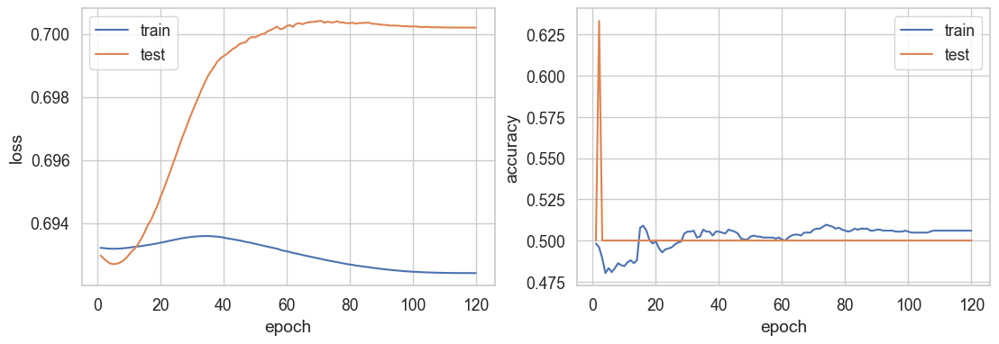

In [160]:
train_losses, test_losses, train_accuracies, test_accuracies, logits = train_and_evaluate(
    model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, device
)


In [161]:
y_test_pred = logits.argmax(dim=1).cpu()

In [162]:
print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print('roc_auc на тесте: ', roc_auc_score(y_test, logits[:,1].cpu().numpy()))


Test Set Metrics:
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1 Score: 0.3333333333333333
roc_auc на тесте:  0.6355555555555557


#### 6-слойная FNN:

In [131]:
from torch import nn

class MLP(nn.Module):
    def __init__(self, n_hid, n_classes, in_features):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(in_features=in_features, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_classes, bias=False),
            nn.Sigmoid()
        )


    def forward(self, x):
        return self.model(x)
        
num_epochs = 120
model = MLP(n_hid=128, n_classes = len(np.unique(y_train)), in_features=scaler_train.shape[1] )
optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
criterion = nn.CrossEntropyLoss().to(device)

model.to(device)

train_loader = DataLoader(Dataset(scaler_train, y_train), batch_size=128, num_workers=0, pin_memory=True)
test_loader =  DataLoader(Dataset(scaler_test, y_test), batch_size=128, num_workers=0, pin_memory=True)

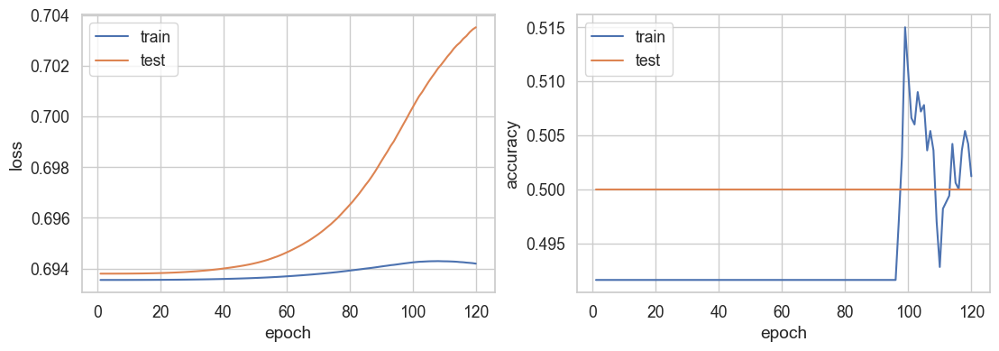

In [133]:
train_losses, test_losses, train_accuracies, test_accuracies, logits = train_and_evaluate(
    model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, device
)

In [134]:
y_test_pred = logits.argmax(dim=1).cpu()

In [135]:
print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print('roc_auc на тесте: ', roc_auc_score(y_test, logits[:,1].cpu().numpy()))


Test Set Metrics:
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1 Score: 0.3333333333333333
roc_auc на тесте:  0.6266666666666667


Подберем для 4-х слойной гиперпараметры, так как по качеству оказалось лучше:

In [199]:
class MLP(nn.Module):
    def __init__(self, n_hid, n_classes, in_features):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(in_features=in_features, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_hid),
            nn.ReLU(),
            nn.Linear(in_features=n_hid, out_features=n_classes, bias=False),
            nn.Sigmoid()
        )


    def forward(self, x):
        return self.model(x)

In [163]:
num_epochs = 120
model = MLP(n_hid=128, n_classes = len(np.unique(y_train)), in_features=scaler_train.shape[1] )
optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
criterion = nn.CrossEntropyLoss().to(device)

Будем перебирать learning rate по логарифмической шкале

In [164]:
np.logspace(-1, -4, num=4)

array([0.1   , 0.01  , 0.001 , 0.0001])

In [165]:
log_scale = np.logspace(-1, -4, num=4)

In [166]:
lr=[]
accuracy_test = []
accuracy_train = []

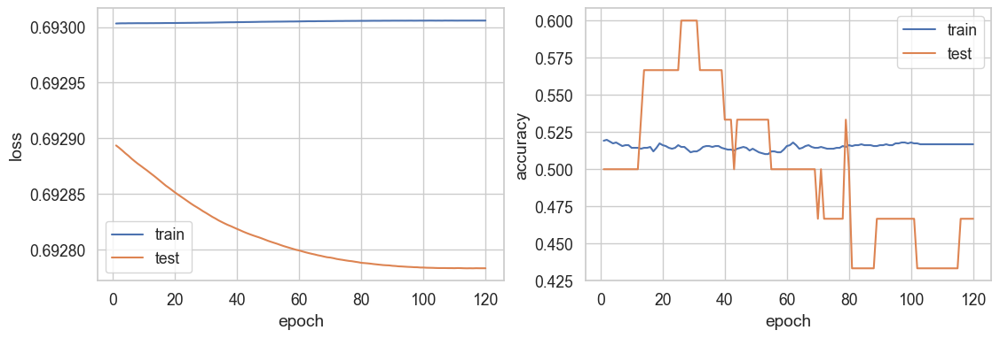

In [167]:
for i in log_scale:
    

    num_epochs = 120
    model = MLP(n_hid=128, n_classes = len(np.unique(y_train)), in_features=scaler_train.shape[1] )
    optimizer = torch.optim.SGD(model.parameters(), lr=i, momentum=0.9)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
    criterion = nn.CrossEntropyLoss().to(device)
    model.to(device)

    train_losses, test_losses, train_accuracies, test_accuracies, logits = train_and_evaluate(model, train_loader, test_loader,
                                                                                             criterion, optimizer,
                                                                                             scheduler, num_epochs, device)

    accuracy_train.append(train_accuracies[-1])
    accuracy_test.append(test_accuracies[-1])
    lr.append(i)


  


In [168]:
for i,j,k in zip(accuracy_train, accuracy_test, lr):
    print('for lr:' ,k)
    print('accuracy on train:' ,i)
    print('accuracy on test:' ,j)
    print("")

for lr: 0.1
accuracy on train: 0.5635491606714629
accuracy on test: 0.6

for lr: 0.01
accuracy on train: 0.5137889688249401
accuracy on test: 0.5

for lr: 0.001
accuracy on train: 0.5
accuracy on test: 0.5

for lr: 0.0001
accuracy on train: 0.5167865707434053
accuracy on test: 0.4666666666666667



Видим, что learning rate = 0.1 оказался наилучшим

Переберем weight decay по логарифмической сетке:

In [173]:
wd_param = np.logspace(-6, -3, 4)
wd_param = np.append(wd_param, 0)
wd_param

array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 0.e+00])

In [180]:
wd = []
accuracy_train = []
accuracy_test = []

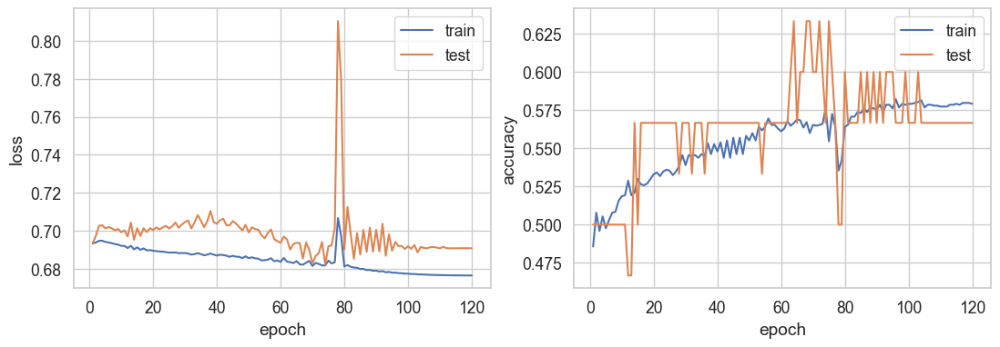

In [181]:
for i in wd_param:

    num_epochs = 120
    model = MLP(n_hid=128, n_classes = len(np.unique(y_train)), in_features=scaler_train.shape[1] )
    optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=i)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
    criterion = nn.CrossEntropyLoss().to(device)
    model.to(device)

    train_losses, test_losses, train_accuracies, test_accuracies, logits = train_and_evaluate(model, train_loader, test_loader,
                                                                                             criterion, optimizer,
                                                                                             scheduler, num_epochs, device)

    accuracy_train.append(train_accuracies[-1])
    accuracy_test.append(test_accuracies[-1])
    wd.append(i)


  
 

In [182]:
for i,j,k in zip(accuracy_train, accuracy_test, wd):
    print('for wd:' ,k)
    print('accuracy on train:' ,i)
    print('accuracy on test:' ,j)
    print("")

for wd: 1e-06
accuracy on train: 0.5743405275779376
accuracy on test: 0.6333333333333333

for wd: 1e-05
accuracy on train: 0.5785371702637889
accuracy on test: 0.5333333333333333

for wd: 0.0001
accuracy on train: 0.5689448441247003
accuracy on test: 0.6

for wd: 0.001
accuracy on train: 0.5605515587529976
accuracy on test: 0.5666666666666667

for wd: 0.0
accuracy on train: 0.579136690647482
accuracy on test: 0.5666666666666667



weight decay = 1e-06 и lr = 0.1 оказались наилучшими гиперпараметрами

Финально обучим с этими гиперпараметрами и увеличим количество эпох:

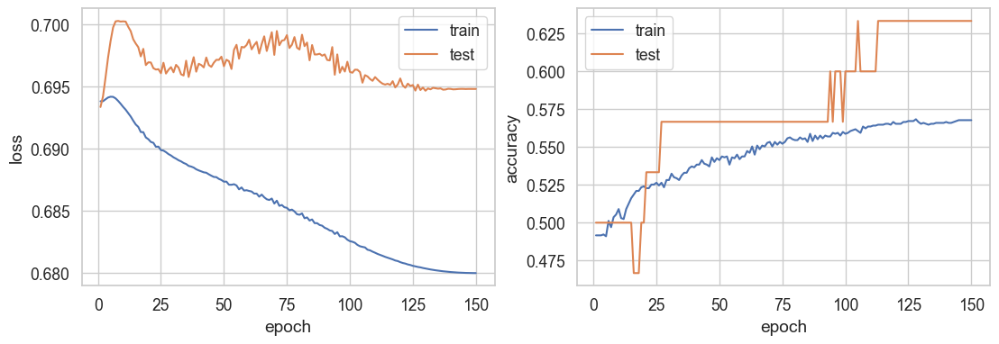

In [211]:
num_epochs = 150
model = MLP(n_hid=128, n_classes = len(np.unique(y_train)), in_features=scaler_train.shape[1] )
optimizer = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.8, weight_decay=  1e-06)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
criterion = nn.CrossEntropyLoss().to(device)
model.to(device)

train_losses, test_losses, train_accuracies, test_accuracies, logits = train_and_evaluate(model, train_loader, test_loader,
                                                                                             criterion, optimizer,
                                                                                             scheduler, num_epochs, device)

In [212]:
y_test_pred = logits.argmax(dim=1).cpu()

In [213]:
print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print('roc_auc на тесте: ', roc_auc_score(y_test, logits[:,1].cpu().numpy()))


Test Set Metrics:
Accuracy: 0.6333333333333333
Precision: 0.7083333333333334
Recall: 0.6333333333333333
F1 Score: 0.5970695970695971
roc_auc на тесте:  0.6044444444444445


In [220]:
torch.save(model,'model_scripted.pt')

## LSTM

Здесь воспользуемся несколько иным методом.Так как у нас лаговые признаки слева направо в датафрейме данных, то повернем зеркально выборку чтобы модель получала данные все ближе по времени к таргету, но для этого удалим признаки не относящиеся к показателю закрытия цены.

In [351]:
X_train = X_train.drop(['moving_average', 'moving_variance', 'changes_lag_1'], axis=1)
X_test = X_test.drop(['moving_average', 'moving_variance', 'changes_lag_1'], axis=1)

Масштабируем датасет перед подачей в модель

In [352]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(-1, 1))
scaler_train = scaler.fit_transform(X_train)
scaler_test = scaler.fit_transform(X_test)

In [353]:
from copy import deepcopy as dc

In [354]:
X_train_flp = dc(np.flip(scaler_train, axis=1))
X_train_flp

array([[-0.8507143 , -0.83207185, -0.82372758, ..., -0.83200941,
        -0.8322228 , -0.83229007],
       [-0.83207185, -0.82372758, -0.82519043, ..., -0.8322228 ,
        -0.8332234 , -0.83318336],
       [-0.82372758, -0.82519043, -0.82526712, ..., -0.8332234 ,
        -0.83476022, -0.8348099 ],
       ...,
       [ 0.84484045,  0.77688563,  0.78820411, ...,  0.78749542,
         0.77815843,  0.77815839],
       [ 0.77688563,  0.78820411,  0.71193866, ...,  0.77815843,
         0.76775052,  0.76775049],
       [ 0.78820411,  0.71193866,  0.77840396, ...,  0.76775052,
         0.79040506,  0.79040503]])

In [355]:
X_test_flp = dc(np.flip(scaler_test, axis=1))
X_test_flp

array([[-3.11029233e-01,  1.79141313e-01,  2.59503663e-01,
         5.18789056e-01,  2.17625085e-01,  5.65381215e-01,
         4.90333421e-01,  8.45390642e-02,  1.22752069e-01,
        -2.36084491e-02, -7.92524202e-02, -1.41278567e-01,
        -6.26836930e-03, -5.83247377e-01, -6.08424415e-01],
       [ 2.07688350e-01,  2.59503663e-01,  5.18789056e-01,
         5.18918401e-01,  5.65381215e-01,  4.90333421e-01,
         9.69842570e-02,  1.22752069e-01, -1.05733324e-02,
        -7.92524202e-02, -1.41278567e-01, -6.26836930e-03,
        -5.83247377e-01, -1.00000000e+00, -1.00000000e+00],
       [ 2.89996274e-01,  5.18789056e-01,  5.18918401e-01,
         9.52724497e-01,  4.90333421e-01,  9.69842570e-02,
         1.35635759e-01, -1.05733324e-02, -6.69601669e-02,
        -1.41278567e-01, -6.26836930e-03, -5.83247377e-01,
        -1.00000000e+00, -8.74336357e-01, -8.81930212e-01],
       [ 5.55558973e-01,  5.18918401e-01,  9.52724497e-01,
         8.59106620e-01,  9.69842570e-02,  1.35635759

In [356]:
X_test.shape, X_train_flp.shape 

((30, 15), (1668, 15))

In [357]:
X_train_flp = X_train_flp.reshape((-1, 15, 1))
X_test_flp = X_test_flp.reshape((-1, 15, 1))
X_train_flp.shape, X_test_flp.shape, y_train.shape, y_test.shape

((1668, 15, 1), (30, 15, 1), (1668,), (30,))

In [358]:
X_train_flp = torch.tensor(X_train_flp).float()
y_train = torch.tensor(y_train).float()
X_test_flp = torch.tensor(X_test_flp).float()
y_test = torch.tensor(y_test).float()

X_train_flp.shape, X_test_flp.shape, y_train.shape, y_test.shape

(torch.Size([1668, 15, 1]),
 torch.Size([30, 15, 1]),
 torch.Size([1668]),
 torch.Size([30]))

In [359]:
y_train = y_train.reshape((-1, 1))
y_test = y_test.reshape((-1, 1))

In [360]:
y_train.shape, y_test.shape

(torch.Size([1668, 1]), torch.Size([30, 1]))

In [361]:
from torch.utils.data import Dataset

class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, i):
        return self.X[i], self.y[i]
    
train_dataset = TimeSeriesDataset(X_train_flp, y_train)
test_dataset = TimeSeriesDataset(X_test_flp, y_test)

In [362]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [363]:
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [364]:
for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)
    print(x_batch.shape, y_batch.shape)
    break

torch.Size([32, 15, 1]) torch.Size([32, 1])


In [365]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        self.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers, 
                            batch_first=True)
        
        self.fc = nn.Linear(hidden_size, 1)


    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

model = LSTM(1,4,3)
model.to(device)
model

LSTM(
  (lstm): LSTM(1, 4, num_layers=3, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

In [366]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

def plot_losses(train_losses, test_losses, train_accuracies, test_accuracies):
    clear_output(wait=True)
    fig, axs = plt.subplots(1, 2, figsize=(13, 4))
    axs[0].plot(range(1, len(train_losses) + 1), train_losses, label='train')
    axs[0].plot(range(1, len(test_losses) + 1), test_losses, label='test')
    axs[0].set_ylabel('loss')
    axs[0].set_xlabel('epoch')
    axs[0].legend()

    axs[1].plot(range(1, len(train_accuracies) + 1), train_accuracies, label='train')
    axs[1].plot(range(1, len(test_accuracies) + 1), test_accuracies, label='test')
    axs[1].set_ylabel('accuracy')
    axs[1].set_xlabel('epoch')
    axs[1].legend()

    plt.show()

def train_val(num_epochs):
    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []

    for epoch in range(1, num_epochs + 1):
        running_loss, running_corrects = 0.0, 0
        total = 0
        model.train()
        print(f'Epoch: {epoch}')
        
        for batch_index, batch in enumerate(train_loader):
            x_batch, y_batch = batch[0].to(device), batch[1].to(device)
            
            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item() * x_batch.size(0)

            predicted = torch.sigmoid(output).ge(0.5)
            running_corrects += (predicted.float() == y_batch).sum().item()
            total += y_batch.size(0)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc =  running_corrects / total
        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc)
        
        model.eval()
        running_loss, running_corrects = 0.0, 0
        total = 0
        
        with torch.no_grad():
            for batch_index, batch in enumerate(test_loader):
                x_batch, y_batch = batch[0].to(device), batch[1].to(device)
                
                output = model(x_batch)
                loss = loss_function(output, y_batch)
                running_loss += loss.item() * x_batch.size(0)
                
                predicted = torch.sigmoid(output).ge(0.5)
                running_corrects += (predicted.float() == y_batch).sum().item()
                total += y_batch.size(0)
        
        epoch_loss = running_loss / len(test_loader.dataset)
        epoch_acc =  running_corrects / total # здесь accuracy в процентах
        test_losses.append(epoch_loss)
        test_accuracies.append(epoch_acc)
        
        plot_losses(train_losses, test_losses, train_accuracies, test_accuracies)

    return train_accuracies[-1], test_accuracies[-1], output



In [367]:
learning_rate = 0.01
num_epochs = 120
loss_function = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

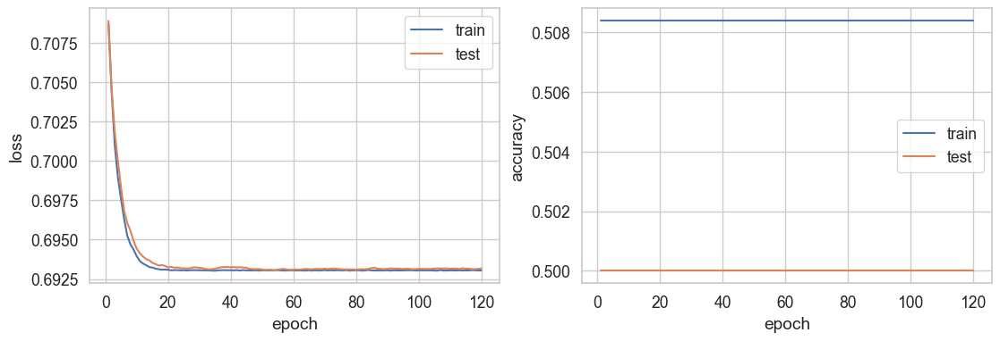

In [368]:
lstm_143 = train_val(num_epochs)

In [369]:
y_test_pred = (lstm_143[2] >= 0.5).cpu().numpy()

In [370]:
y_test = y_test.detach().cpu().numpy()

In [371]:
print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print("Precision:", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall:", recall_score(y_test, y_test_pred, average='weighted'))
print("F1 Score:", f1_score(y_test, y_test_pred, average='weighted'))
print('roc_auc на тесте: ',  roc_auc_score(y_test, lstm_143[2].cpu().numpy()))


Test Set Metrics:
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1 Score: 0.3333333333333333
roc_auc на тесте:  0.711111111111111


Проитерируемся с lr по логаримической шкале, изменя количество скрытых слоев (hidden size) и количество стековых слоев lstm (stacked layers)

In [372]:
log_scale = np.logspace(-1, -4, num=4)

In [373]:
log_scale

array([0.1   , 0.01  , 0.001 , 0.0001])

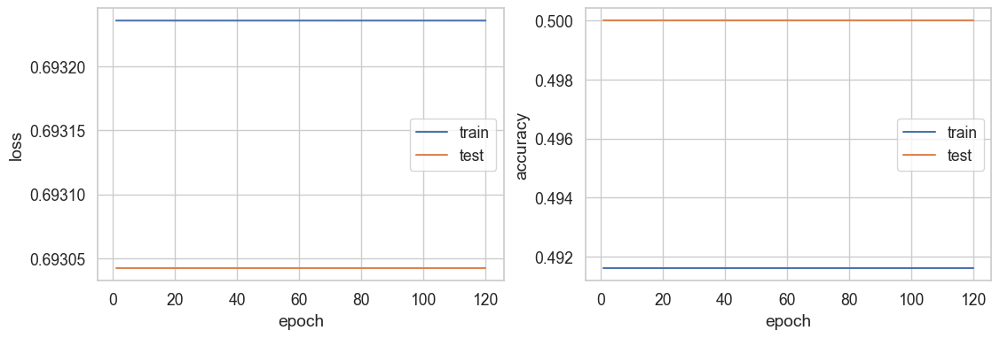

for lr: 0.1
accuracy on train: 0.5083932853717026
accuracy on test: 0.5

for lr: 0.01
accuracy on train: 0.5083932853717026
accuracy on test: 0.5

for lr: 0.001
accuracy on train: 0.49160671462829736
accuracy on test: 0.5

for lr: 0.0001
accuracy on train: 0.49160671462829736
accuracy on test: 0.5



In [374]:
lr=[]
accuracy_train = []
accuracy_test = []

for i in log_scale:
    learning_rate = i
    num_epochs = 120
    loss_function = nn.BCEWithLogitsLoss().to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    model = LSTM(1, 2,2)
    model.to(device)
    result = train_val(num_epochs)
    accuracy_train.append(result[0])
    accuracy_test.append(result[1])
    lr.append(i)

for i,j,k in zip(accuracy_train, accuracy_test, lr):
    print('for lr:' ,k)
    print('accuracy on train:' ,i)
    print('accuracy on test:' ,j)
    print("")

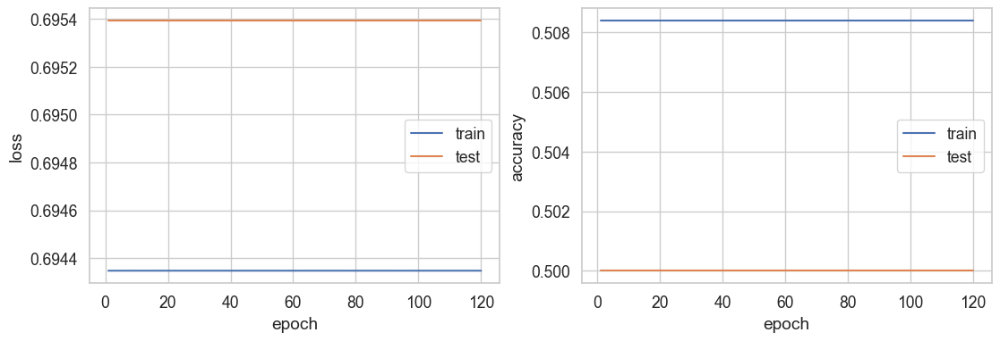

for lr: 0.1
accuracy on train: 0.49160671462829736
accuracy on test: 0.5

for lr: 0.01
accuracy on train: 0.49160671462829736
accuracy on test: 0.5

for lr: 0.001
accuracy on train: 0.5083932853717026
accuracy on test: 0.5

for lr: 0.0001
accuracy on train: 0.5083932853717026
accuracy on test: 0.5



In [375]:
lr=[]
accuracy_train = []
accuracy_test = []

for i in log_scale:
    learning_rate = i
    num_epochs = 120
    loss_function = nn.BCEWithLogitsLoss().to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    model = LSTM(1, 3, 3)
    model.to(device)
    result = train_val(num_epochs)
    accuracy_train.append(result[0])
    accuracy_test.append(result[1])
    lr.append(i)

for i,j,k in zip(accuracy_train, accuracy_test, lr):
    print('for lr:' ,k)
    print('accuracy on train:' ,i)
    print('accuracy on test:' ,j)
    print("")

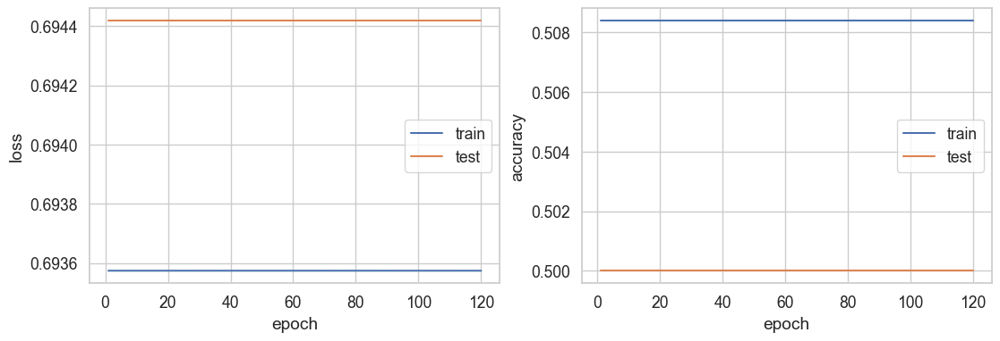

for lr: 0.1
accuracy on train: 0.5083932853717026
accuracy on test: 0.5

for lr: 0.01
accuracy on train: 0.49160671462829736
accuracy on test: 0.5

for lr: 0.001
accuracy on train: 0.5083932853717026
accuracy on test: 0.5

for lr: 0.0001
accuracy on train: 0.5083932853717026
accuracy on test: 0.5



In [376]:
lr=[]
accuracy_train = []
accuracy_test = []

for i in log_scale:
    learning_rate = i
    num_epochs = 120
    loss_function = nn.BCEWithLogitsLoss().to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    model = LSTM(1, 5, 5)
    model.to(device)
    result = train_val(num_epochs)
    accuracy_train.append(result[0])
    accuracy_test.append(result[1])
    lr.append(i)

for i,j,k in zip(accuracy_train, accuracy_test, lr):
    print('for lr:' ,k)
    print('accuracy on train:' ,i)
    print('accuracy on test:' ,j)
    print("")

Видим, что в обучении не удается превысить accurcacy больше, чем 0.51 на тестовой выборке. Что говорит о том, что модели lstm под представленные данные не удается развить обобщающую способность. Такое возможно происходит по причине очень маленькой выборке для данного вида рекуррентой сети и особенностей данных.



### Вывод: исходя из имеющихся данных, признакового описания, классические методы машинного обучения и известные методы глубокого обучения показывают не очень хорошее качество. Наилучший скор у полносвязной нейронной 4-х слойной сети, которая демонстрирует accuracy 0.63, recall 0.63, precision 0.71, roc-auc 0.6, хотя данное качество и не является хорошим, но лучше, чем случайное угадывание. Очевидно, что для улучшения качества нужен более глубокий feature engeneering, увеличение количества и качества признаков, однако в данной работе такая цель не ставится и носит скорее демонстрационный вариант, как на достаточно обычных данных без значительной работы над признаками показывают себя наиболее известные методы ML/DL для данной задачи классификации.

# Часть 3. Прогноз моделями типа ARIMA в задачи регрессии

In [337]:
from scipy import stats 
import statsmodels.api as sm
import pmdarima as pm
from pmdarima import model_selection 
import sktime
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.base import ForecastingHorizon
from sktime.utils.plotting import plot_series
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.dates as mdates


Посмотрим на временной ряд(цена биткоина в долларах):

<Axes: title={'center': 'BTC - USD'}>

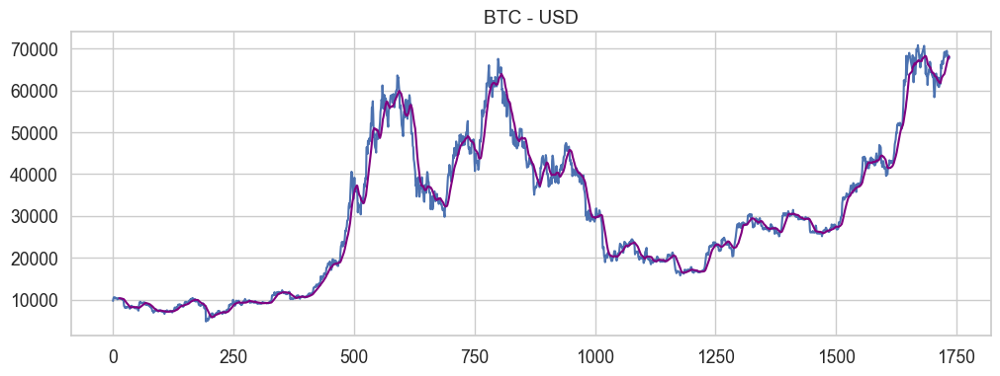

In [378]:
plt.rc('figure', figsize=(12, 4))
plt.title('BTC - USD')
df['close'].plot()
rolling_mean =  df['close'].rolling(window=14).mean()
rolling_mean.plot(color='purple')

Сделаем декомпозицию ряда на тренд, сезонность и остатки

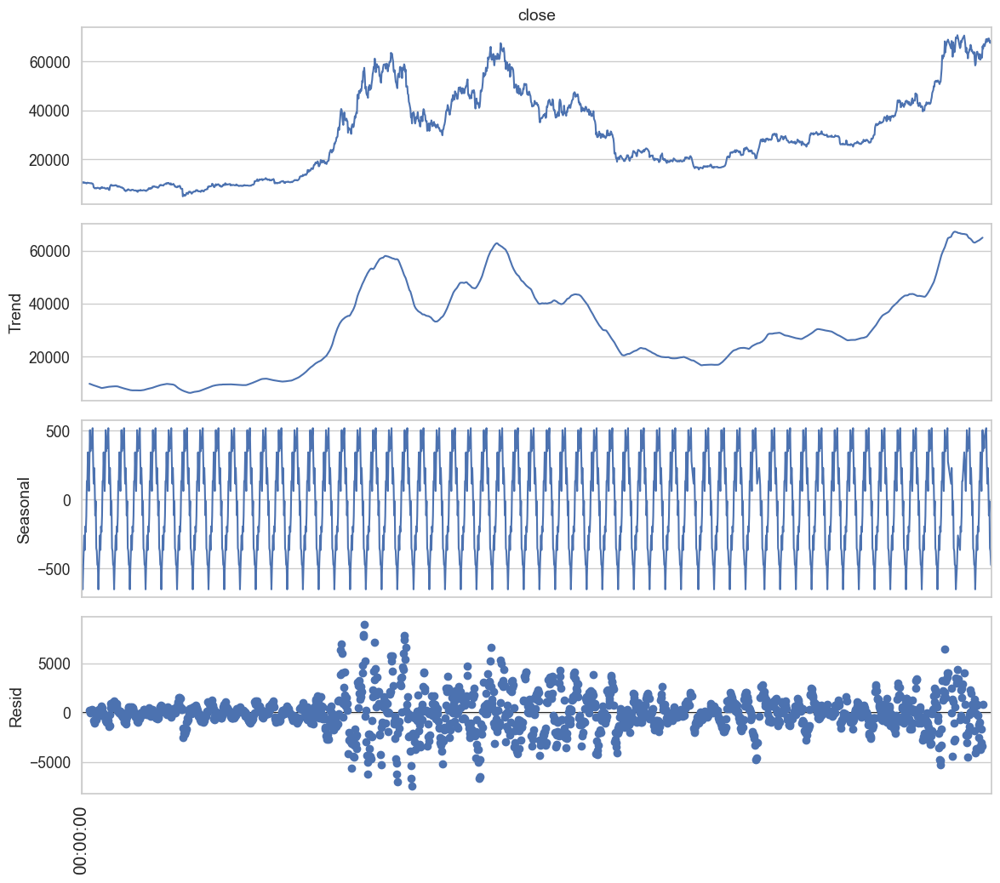

In [402]:
df.index = pd.to_datetime(df.index)
sd = seasonal_decompose(df['close'], period=10, model='additive')
plt.rc('figure', figsize=(12, 10))
fig = sd.plot()
for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=90,fontsize=15)

    
plt.show()


Видно, что есть и тренд и сезонность в данных, следовательно ряд нестационарен

### Модель SARIMAX/ARIMA с логарифмированной выборкой

Одним из способов во временных рядах уменьшить дисперсию является логарифмирование временного ряда. Проделаем его с тренировочной выборкой и обучим модели.

Возьмем для тестовой выборки недельные данные и сформируем экзогенные факторы:

In [433]:
Train = df_crypto.loc['2019-09-15':'2024-05-24'] 
Test = df_crypto.loc['2024-05-25':'2024-06-01'] 

X_test = Test
y_train = Train['close']# за таргет берем цену закрытия 
y_test = Test['close']

Проллогарифмируем временной ряд цен: 

In [434]:
y_train = np.log(y_train)

In [435]:
y_train

open_time
2019-09-15     9.240094
2019-09-16     9.235161
2019-09-17     9.228948
2019-09-18     9.225917
2019-09-19     9.234476
                ...    
2024-05-18    11.111181
2024-05-19    11.101553
2024-05-22    11.144274
2024-05-23    11.126817
2024-05-24    11.135319
Name: close, Length: 1690, dtype: float64

Методом  auto_arima подберем значения p,d,q для дальнейшего использования и рассмотрим временной ряд.

In [456]:
arima_model = pm.auto_arima(
    
    y_train,
    start_p=1, start_q=1,
    max_p=100, max_q=100,
    
    seasonal=True, m=2,
    start_P=1, start_Q=0,
    max_P=14, max_Q=14,
    
    max_D=2, max_d=2,
    alpha=0.05,
    
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=False,
    n_fits=2000,
    test='kpss',
    seasonal_test='ocsb',
    out_of_sample=100,
    scoring='mae')

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=-6486.054, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=-6487.796, Time=0.16 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=-6487.445, Time=0.17 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=-6485.491, Time=0.21 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=-6484.036, Time=0.15 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=-6482.274, Time=0.18 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=-6488.024, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=-6486.980, Time=0.09 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=-6485.076, Time=0.22 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=-6483.799, Time=0.28 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=-6482.184, Time=0.38 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=-6487.422, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=-6485.415, Time=0.20 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=-6483.027, Time=0.36 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=-6481.784, Time=0.48

Метод подобрал наилучшие значения p,d,q = (0,1,1) и P,D,Q = (1,0,0)[2]

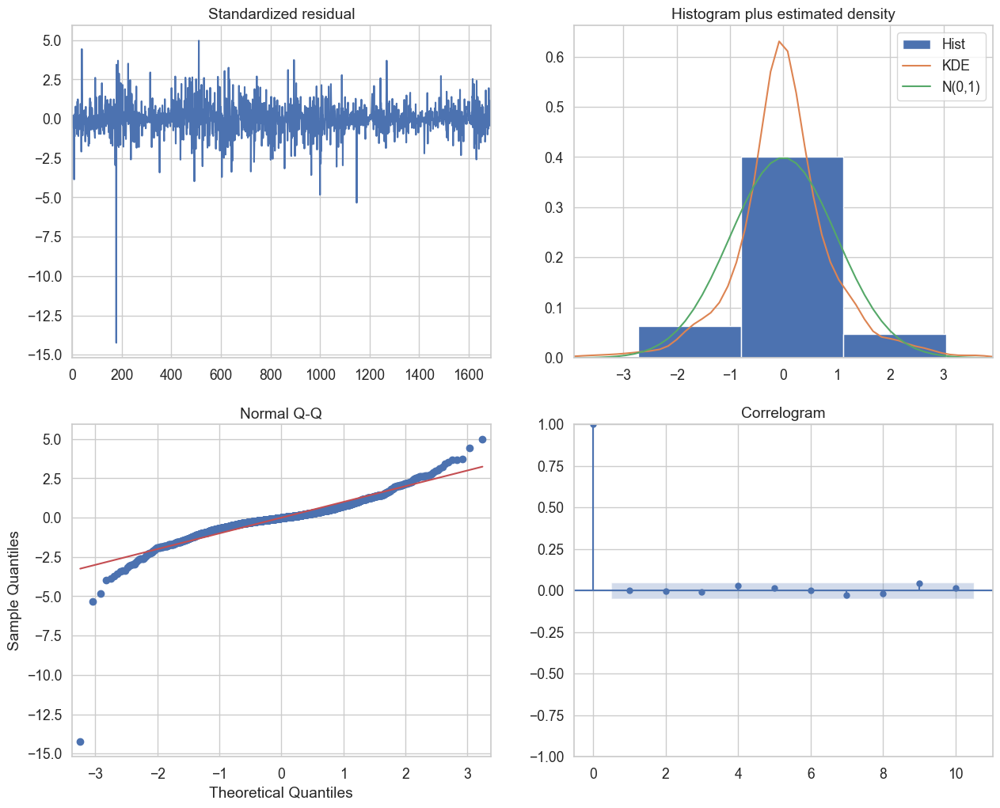

In [457]:
arima_model.plot_diagnostics(figsize=(15, 12))
plt.show()

Видно:  
- Standardized Residuals: у остатков нулевое среднее, практически одинаковая дисперсия c некоторыми всплесками
- Histogram plus estimated density:  гистограмма остатков и оцененная плотность показывают, что остатки близки к нормальному распределению
- Normal Q-Q Plot: график показывает, что остатки в основном следуют нормальному распределению,  крайние значения немного отклоняются
- Correlogram: коррелограмма показывает, что автокорреляция остатков находится в пределах доверительного интервала.

Используем SARIMA модель

Прогноз модели будем проводить как прогноз на один шаг вперед, скользящим окном. Т.е. после каждого прогноза из тестовой выборки будет добавляться наблюдение за тот день, на который уже сделан прогноз в тренировочную выборку. И делаться прогноз на следующий шаг.

In [458]:
history = []
history = [x for x in y_train]
predictions = list()
for t in range(len(y_test)):
    # Формируем прогноз моделью
    model = sm.tsa.statespace.SARIMAX(history, exog=None, order=(0, 1, 1), seasonal_order=(1, 0, 0, 2)) 
    results = model.fit()
    forecast = results.forecast(steps=1, exog=None)
    yhat = np.exp(forecast[0])
    predictions.append(yhat)
    # Добавляем прогнозное значение в тренировочную выборку для следующей итерации
    obs = np.log(y_test[t])
    history.append(obs)

Сравнивать будем с наивным прогнозом, который берет цену открытия в начале суток

In [459]:
print('MAPE: ', mean_absolute_percentage_error(predictions, y_test))
print('MAE: ', mean_absolute_error(predictions, y_test))
 
print('Naive MAPE: ', mean_absolute_percentage_error(y_test, X_test['open']))
print('Naive MAE: ', mean_absolute_error( y_test, X_test['open']))

MAPE:  0.010626945428499382
MAE:  728.9002722794448
Naive MAPE:  0.010913041338374344
Naive MAE:  746.8762499999993


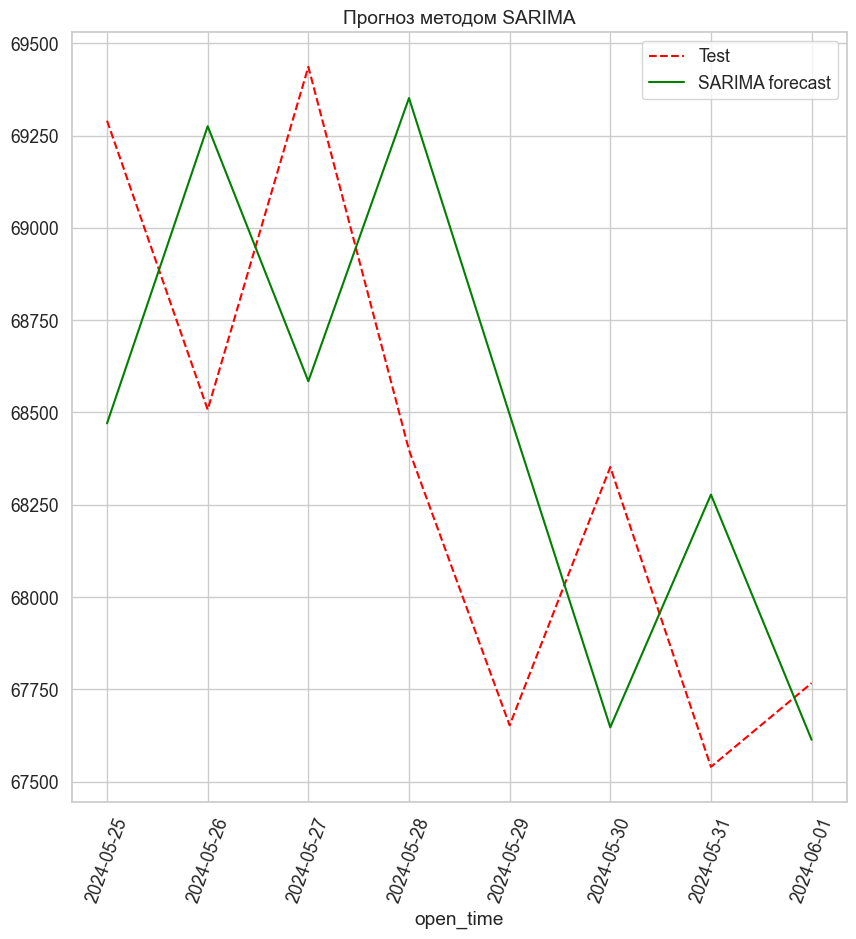

In [460]:
y_test.plot(style='--', color='red', title="Прогноз методом SARIMA", figsize=(10,10))
plt.plot(predictions, color='green', label = 'SARIMA forecast')
L = plt.legend()
L.get_texts()[0].set_text('Test')
plt.xticks(rotation=70)
plt.show()

### Модель SARIMAX/ARIMA без преобразований выборки

In [461]:
Train = df_crypto.loc['2019-09-15':'2024-05-24'] 
Test = df_crypto.loc['2024-05-25':'2024-06-01']

X_test = Test
y_train = Train['close']# за таргет берем цену закрытия 
y_test = Test['close']

Посмотрим на трен. выборку

In [462]:
y_train

open_time
2019-09-15    10302.01
2019-09-16    10251.31
2019-09-17    10187.82
2019-09-18    10156.99
2019-09-19    10244.29
                ...   
2024-05-18    66915.20
2024-05-19    66274.01
2024-05-22    69166.62
2024-05-23    67969.65
2024-05-24    68549.99
Name: close, Length: 1690, dtype: float64

Подберем p,d,q для моделей

In [463]:
arima_model = pm.auto_arima(
    
    y_train,
    start_p=1, start_q=1,
    max_p=100, max_q=100,
    
    seasonal=True, m=2,
    start_P=1, start_Q=0,
    max_P=14, max_Q=14,
    
    max_D=2, max_d=2,
    alpha=0.05,
    
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=False,
    n_fits=2000,
    test='kpss',
    seasonal_test='ocsb',
    out_of_sample=100,
    scoring='mae')

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=28696.573, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=28698.572, Time=0.04 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=28700.369, Time=0.06 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=28702.360, Time=0.08 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=28704.252, Time=0.13 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=28706.191, Time=0.18 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=28698.572, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=28700.596, Time=0.05 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=28701.298, Time=0.28 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=28704.426, Time=0.13 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=28706.191, Time=0.20 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=28700.372, Time=0.06 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=28702.421, Time=0.07 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=28702.976, Time=0.69 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=28706.302, Time=0.38

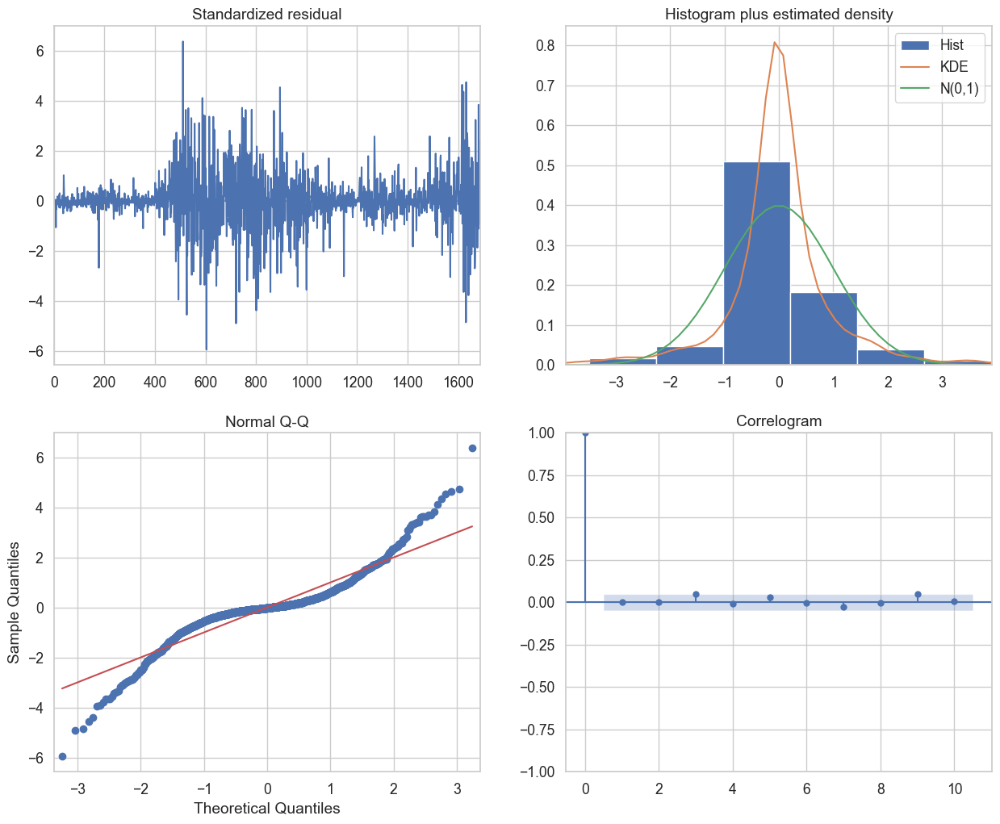

In [464]:
arima_model.plot_diagnostics(figsize=(15, 12))
plt.show()

Видно:

- Standardized Residuals: есть выбросы в середине, справа
- Histogram plus estimated density: остатки не совсем соотвтетствуют нормальному распределению
- Normal Q-Q Plot: видны тклонения от нормальности и в середине и на хвостах
- Correlogram:практически все остатки находятся в пределах доверительного интервала


Обучим модель аналогично предыдущему разу, использовав найденные порядки p,d,q

In [466]:
history = []
history = [x for x in y_train]
predictions = list()
for t in range(len(y_test)):
    # Формируем прогноз моделью, на каждом шаге
    model = sm.tsa.statespace.SARIMAX(history, exog=None, order=(1, 1, 0), seasonal_order=(0, 0, 0, 2)) 
    results = model.fit()
    forecast = results.forecast(steps=1, exog=None)
    yhat = forecast[0]
    predictions.append(yhat)
    # Добавляем прогнозное значение в тренировочную выборку для следующей итерации
    obs = y_test[t]
    history.append(obs)

In [467]:
print('MAPE: ', mean_absolute_percentage_error(predictions, y_test))
print('MAE: ', mean_absolute_error(predictions, y_test))
 
print('Naive MAPE: ', mean_absolute_percentage_error(y_test, X_test['open']))
print('Naive MAE: ', mean_absolute_error( y_test, X_test['open']))

MAPE:  0.010626009846563214
MAE:  728.9544441674352
Naive MAPE:  0.010913041338374344
Naive MAE:  746.8762499999993


Видим, что качество аналогичное


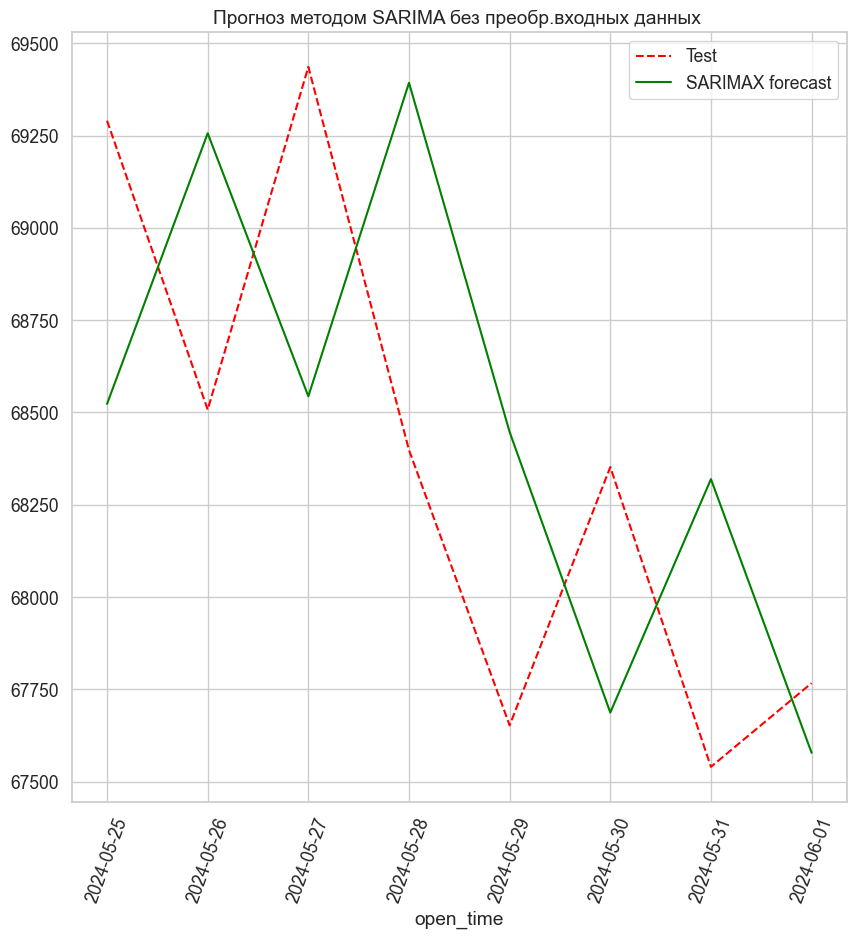

In [469]:
y_test.plot(style='--', color='red', title="Прогноз методом SARIMA без преобр.входных данных ", figsize=(10,10))
plt.plot(predictions, color='green', label = 'SARIMAX forecast')
L = plt.legend()
L.get_texts()[0].set_text('Test')
plt.xticks(rotation=70)
plt.show()

### Модель SARIMAX/ARIMA с преобразований выборки методом Бокса-Кокса

Преобразование методом Бокса-Кокса часто используется для стабилизации дисперсии и приближения данных к нормальному распределению, поэтому стоит применить его в данном временном ряду. Практически как логарифмирование, но отличается коэффициентом lambda, отличиным от нуля:

$ y_i = \begin{cases} 
\frac{x_i^\lambda - 1}{\lambda}, & \text{если } \lambda \neq 0 \\
\ln(x_i), & \text{если } \lambda = 0 
\end{cases} 
$

Обратное преобразование:

$ x_i = \begin{cases} 
(y_i \cdot \lambda + 1)^{\frac{1}{\lambda}}, & \text{если } \lambda \neq 0 \\
e^{y_i}, & \text{если } \lambda = 0 
\end{cases} 
$


In [470]:
from scipy import stats

In [528]:
Train = df_crypto.loc['2019-09-15':'2024-05-24'] 
Test = df_crypto.loc['2024-05-25':'2024-06-01'] 

X_test = Test
y_train = Train['close']# за таргет берем цену закрытия 
y_test = Test['close']

Функция обратного преобразования:

In [529]:
def inverse_boxcox(y, lambda_value):
    if lambda_value == 0:
        return np.exp(y)
    else:
        return (y * lambda_value + 1) ** (1 / lambda_value)

Подберем p, d, q для модели выбором оптимальной lambda в формуле Бокса-Кокса. Для этого рассмотрим полученные графики.

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=-3099.993, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=-3100.573, Time=0.12 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=-3099.360, Time=0.16 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=-3097.393, Time=0.22 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=-3095.899, Time=0.30 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=-3094.106, Time=0.33 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=-3100.679, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=-3099.197, Time=0.32 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=-3096.837, Time=0.23 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=-3095.716, Time=0.25 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=-3094.072, Time=0.46 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=-3099.352, Time=0.15 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=-3097.346, Time=0.22 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=-3094.988, Time=0.28 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=-3093.737, Time=0.34

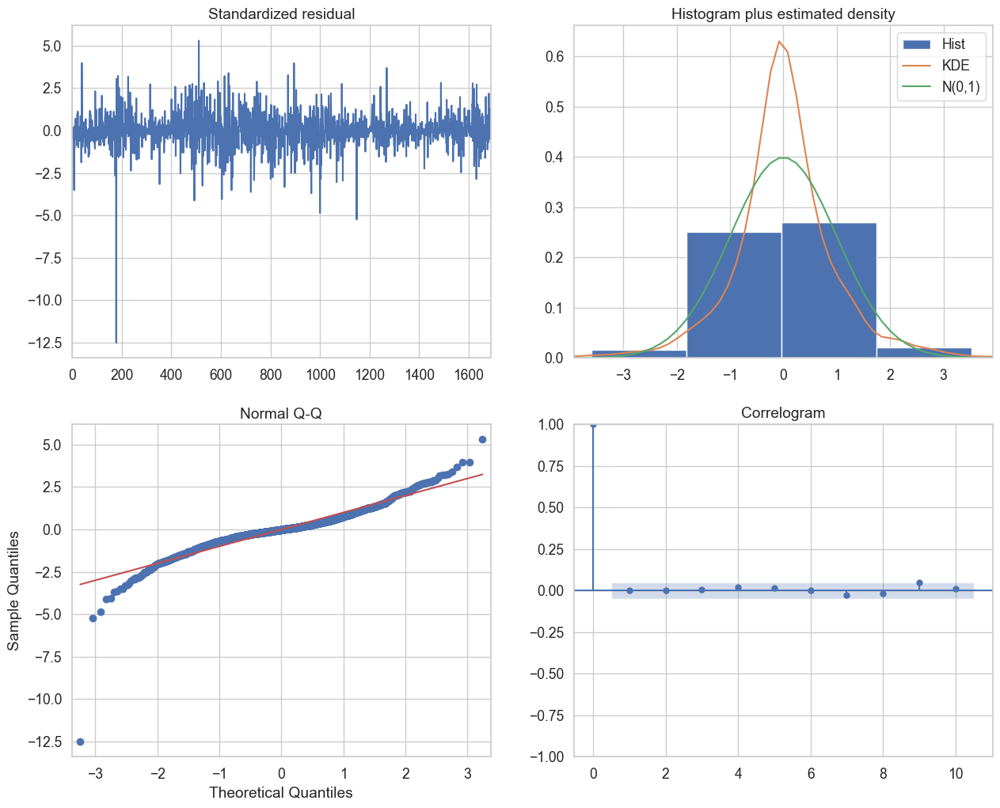

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=326.902, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=327.187, Time=0.09 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=328.873, Time=0.12 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=330.851, Time=0.16 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=332.413, Time=0.24 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=334.242, Time=0.31 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=327.142, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=328.924, Time=0.24 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=331.186, Time=0.17 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=332.241, Time=0.56 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=333.986, Time=0.70 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=328.874, Time=0.10 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=330.897, Time=0.17 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=332.682, Time=0.44 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=333.941, Time=0.61 sec
 ARIMA(0,1,0)(3,0,0)[2] i

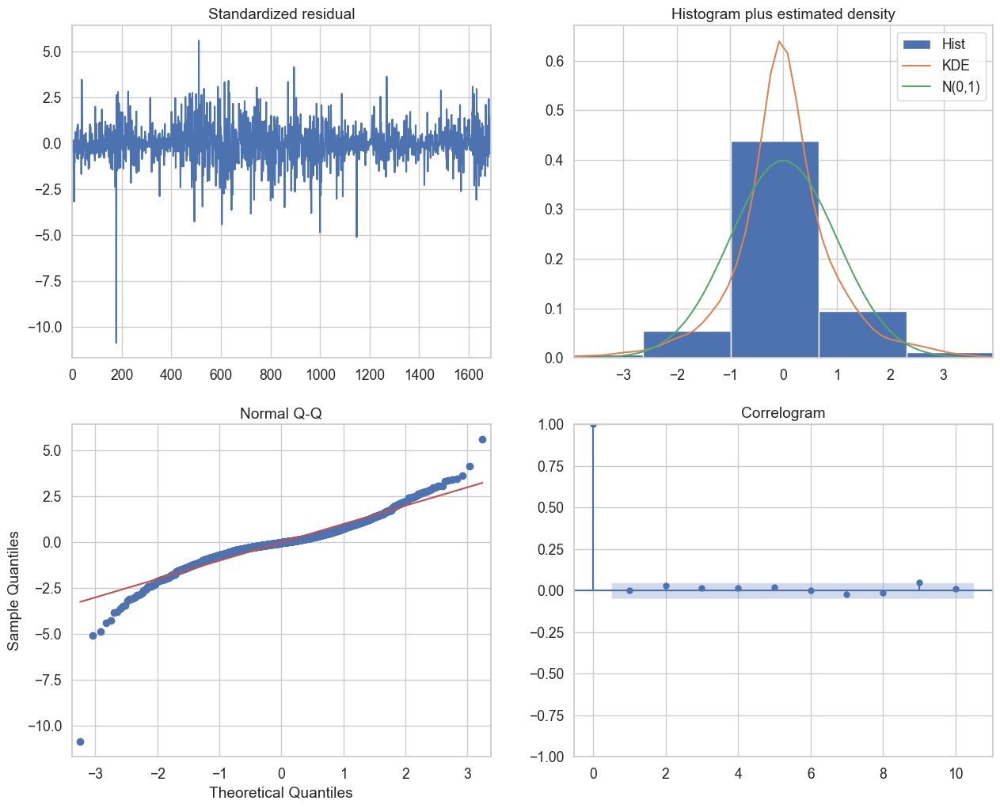

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=3790.266, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=3791.163, Time=0.05 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=3793.074, Time=0.07 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=3795.060, Time=0.11 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=3796.685, Time=0.16 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=3798.537, Time=0.26 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=3791.148, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=3793.082, Time=0.18 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=3794.782, Time=0.38 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=3796.350, Time=0.40 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=3798.090, Time=0.63 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=3793.073, Time=0.09 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=3795.088, Time=0.12 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=3796.657, Time=0.35 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(3

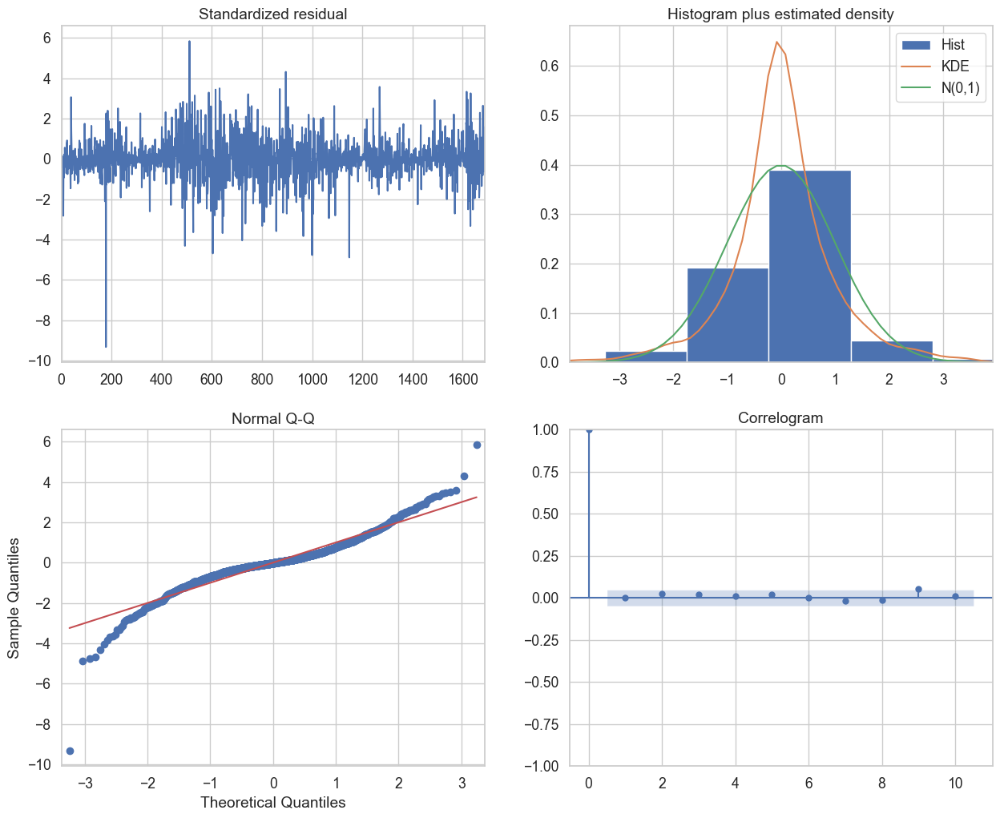

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=7285.361, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=7286.677, Time=0.05 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=7288.668, Time=0.07 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=7290.659, Time=0.09 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=7292.342, Time=0.15 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=7294.210, Time=0.20 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=7286.674, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=7288.667, Time=0.15 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=7290.108, Time=0.33 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=7291.837, Time=0.44 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=7293.548, Time=0.61 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=7288.667, Time=0.09 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=7290.670, Time=0.11 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=7292.064, Time=0.35 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=7293.442, Time=1.10 sec
 ARIMA(0,1

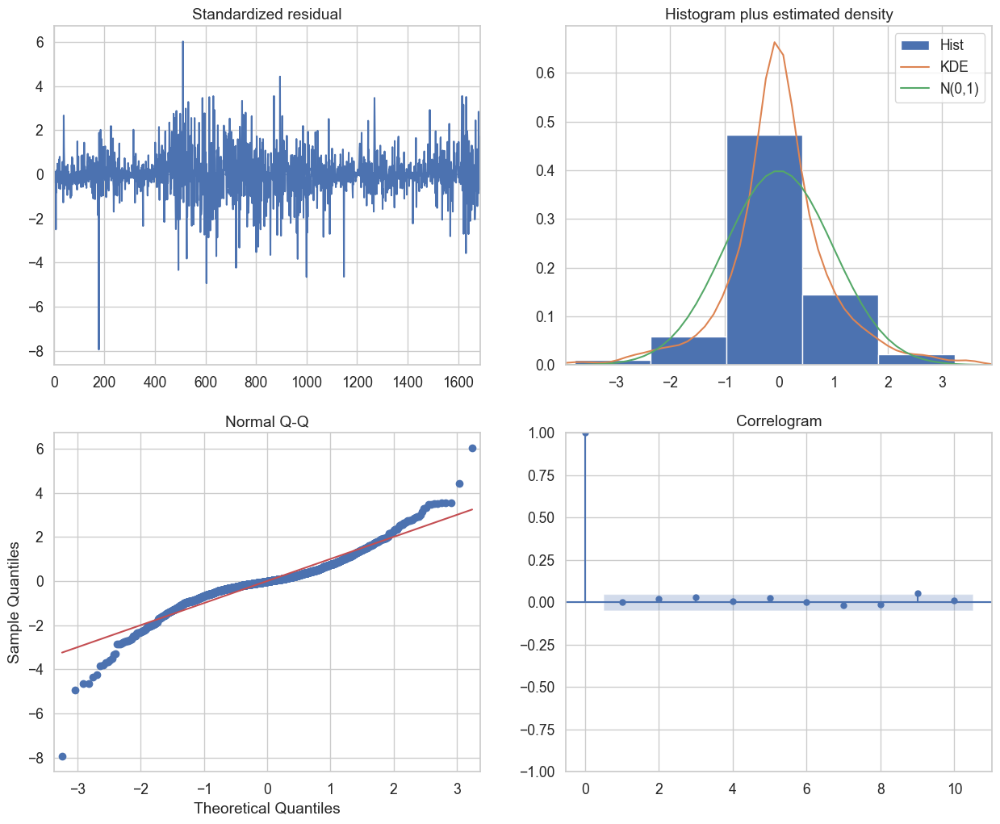

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=10807.548, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=10809.141, Time=0.05 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=10811.137, Time=0.06 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=10813.131, Time=0.08 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=10814.867, Time=0.13 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=10816.747, Time=0.20 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=10809.142, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=10811.135, Time=0.09 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=10812.365, Time=0.35 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=10814.190, Time=0.59 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=10815.861, Time=0.57 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=10811.137, Time=0.10 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=10813.135, Time=0.17 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=10814.356, Time=0.44 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=10816.361, Time=0.54

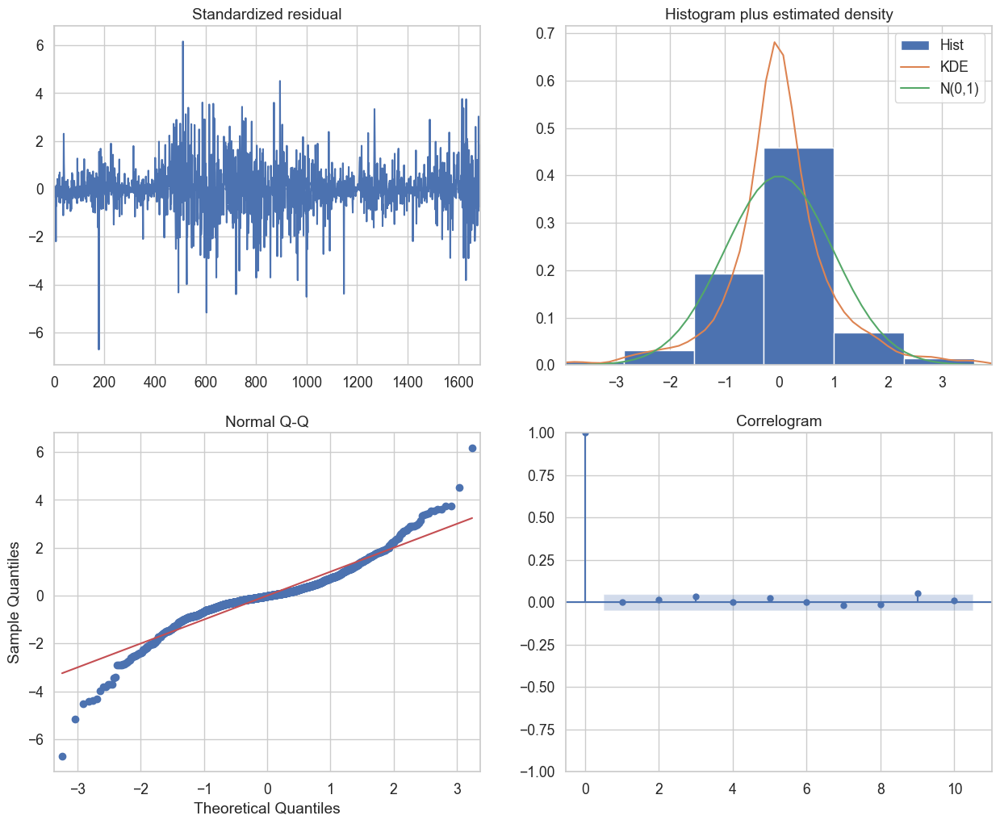

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=14352.591, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=14354.362, Time=0.03 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=14356.329, Time=0.07 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=14358.327, Time=0.08 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=14360.109, Time=0.13 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=14361.999, Time=0.17 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=14354.365, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=14356.344, Time=0.14 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=14357.383, Time=0.44 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=14360.279, Time=0.29 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=14360.886, Time=0.93 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=14356.330, Time=0.08 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=14358.327, Time=0.18 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=14359.385, Time=0.50 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=14361.383, Time=0.74

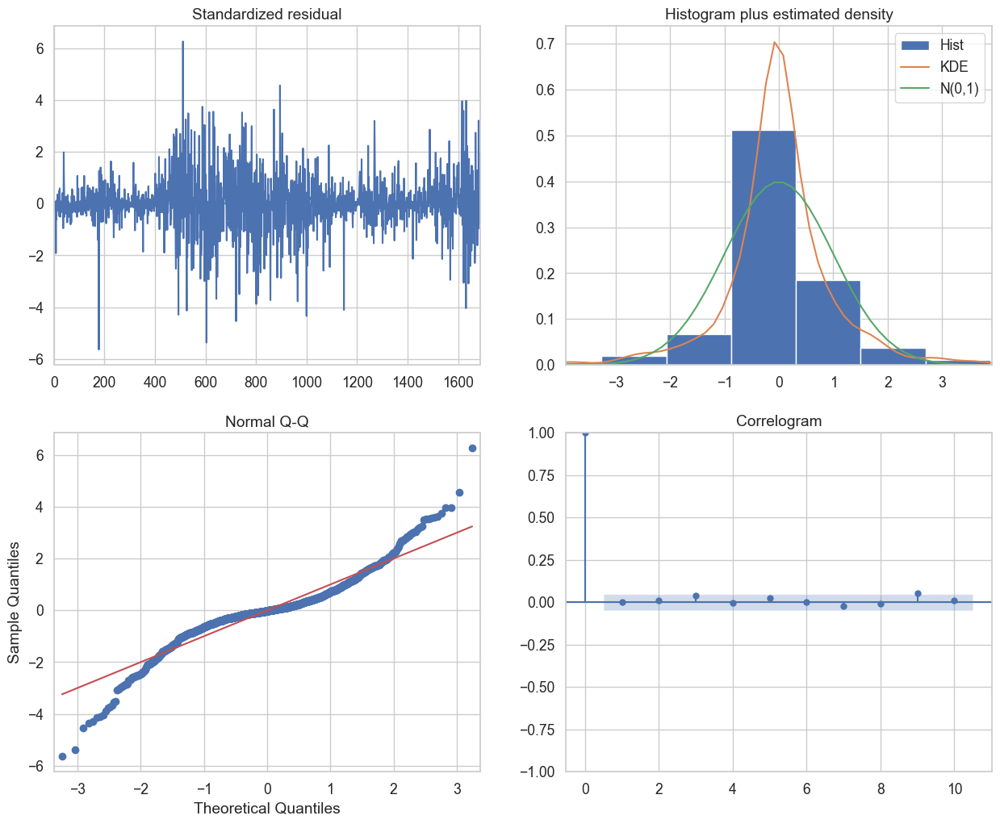

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=17916.817, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=17918.700, Time=0.05 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=17920.623, Time=0.06 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=17922.623, Time=0.07 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=17924.446, Time=0.12 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=17926.346, Time=0.18 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=17918.701, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=17920.697, Time=0.05 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=17921.528, Time=0.48 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=17924.604, Time=0.30 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=17925.024, Time=0.57 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=17920.625, Time=0.06 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=17922.642, Time=0.09 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=17923.536, Time=0.43 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=17925.526, Time=0.57

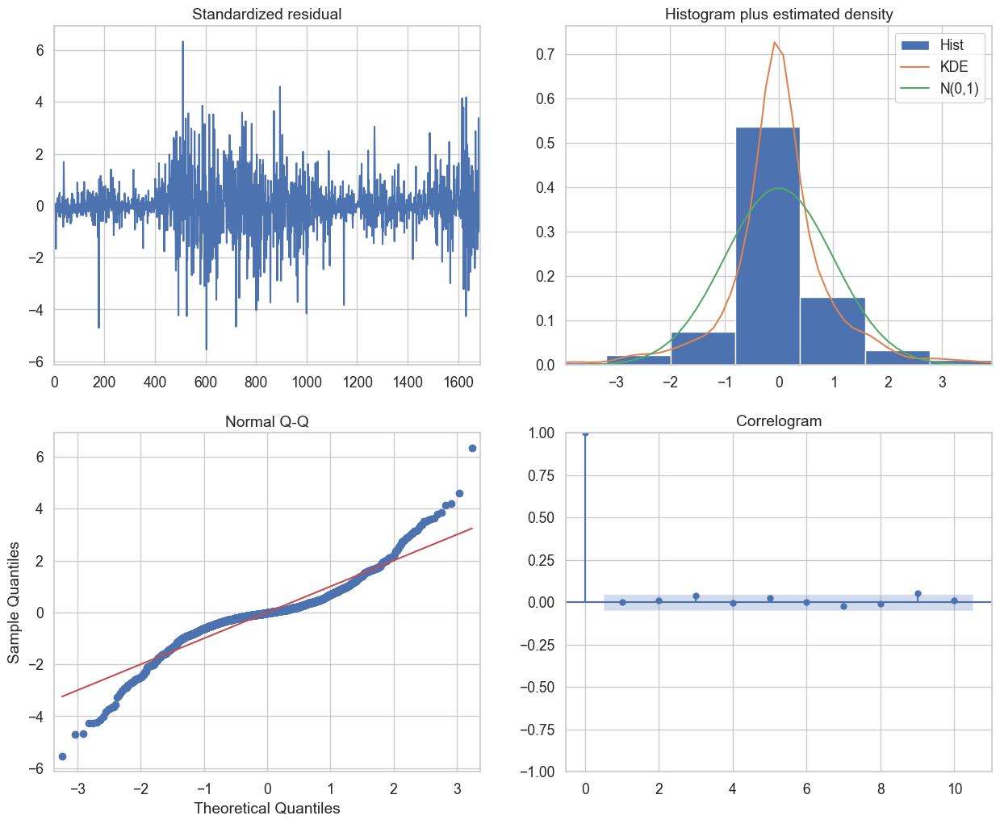

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=21497.150, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=21499.098, Time=0.04 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=21500.977, Time=0.06 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=21502.977, Time=0.07 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=21504.834, Time=0.11 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=21506.744, Time=0.18 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=21499.099, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=21501.100, Time=0.05 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=21503.014, Time=0.08 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=21505.023, Time=0.13 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=21505.422, Time=0.66 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=21500.979, Time=0.06 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=21503.003, Time=0.10 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=21503.760, Time=0.45 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=21505.747, Time=0.59

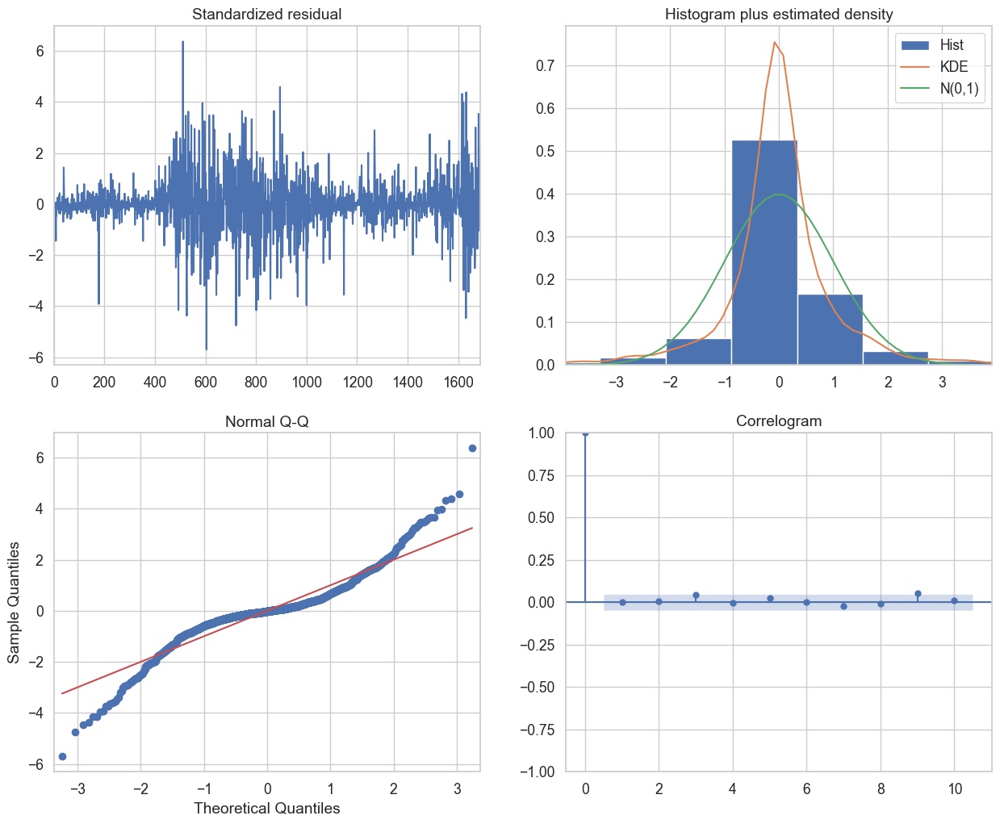

 ARIMA(0,1,0)(0,0,0)[2] intercept   : AIC=25091.076, Time=0.01 sec
 ARIMA(0,1,0)(0,0,1)[2] intercept   : AIC=25093.061, Time=0.04 sec
 ARIMA(0,1,0)(0,0,2)[2] intercept   : AIC=25094.896, Time=0.06 sec
 ARIMA(0,1,0)(0,0,3)[2] intercept   : AIC=25096.894, Time=0.08 sec
 ARIMA(0,1,0)(0,0,4)[2] intercept   : AIC=25098.774, Time=0.11 sec
 ARIMA(0,1,0)(0,0,5)[2] intercept   : AIC=25100.697, Time=0.16 sec
 ARIMA(0,1,0)(1,0,0)[2] intercept   : AIC=25093.061, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[2] intercept   : AIC=25095.071, Time=0.05 sec
 ARIMA(0,1,0)(1,0,2)[2] intercept   : AIC=25096.939, Time=0.08 sec
 ARIMA(0,1,0)(1,0,3)[2] intercept   : AIC=25098.948, Time=0.13 sec
 ARIMA(0,1,0)(1,0,4)[2] intercept   : AIC=25100.707, Time=0.18 sec
 ARIMA(0,1,0)(2,0,0)[2] intercept   : AIC=25094.898, Time=0.06 sec
 ARIMA(0,1,0)(2,0,1)[2] intercept   : AIC=25096.933, Time=0.08 sec
 ARIMA(0,1,0)(2,0,2)[2] intercept   : AIC=25097.571, Time=0.53 sec
 ARIMA(0,1,0)(2,0,3)[2] intercept   : AIC=25099.557, Time=0.62

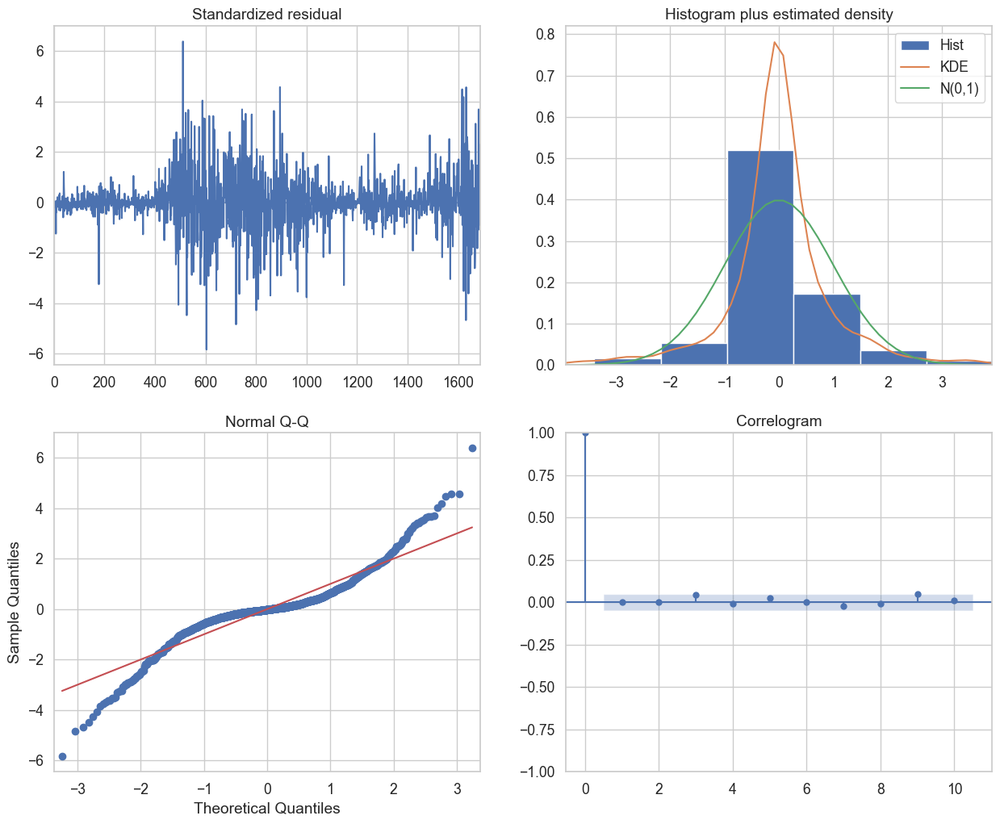

In [530]:
for i in range(1, 10): # итерируемся по различными lambda от 0.1 до 0.9

    
    lm = i/10
    y_train = stats.boxcox(y_train, lmbda=lm) # преобразуем данные 

    arima_model = pm.auto_arima(
    
    y_train,
    start_p=1, start_q=1,
    max_p=100, max_q=100,
    
    seasonal=True, m=2,
    start_P=1, start_Q=0,
    max_P=14, max_Q=14,
    
    max_D=2, max_d=2,
    alpha=0.05,
    
    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=False,
    n_fits=2000,
    test='kpss',
    seasonal_test='ocsb',
    out_of_sample=100,
    scoring='mae')
    
    y_train = inverse_boxcox(y_train, lm)


    arima_model.plot_diagnostics(figsize=(15, 12))
    print('For Box-Cox lambda = ', lm)
    plt.show()

Видим, что при $lambda$ = 0.1 остатки менее всего зависят от друг друга и находятся в пределах доврер. интервала

Параметры (1,1,0)(0,0,0)[2]

In [534]:
y_train = stats.boxcox(y_train, lmbda=0.1)

In [541]:
history = []
history = [x for x in y_train]
predictions = list()
for t in range(len(y_test)):
    # Формируем прогноз моделью
    model = sm.tsa.statespace.SARIMAX(history, exog=None, order=(1, 1, 0), seasonal_order=(0, 0, 0,2)) 
    results = model.fit()
    forecast = results.forecast(steps=1, exog=None)
    yhat = inverse_boxcox(forecast[0], 0.1)
    predictions.append(yhat)
    # Добавляем прогнозное значение в тренировочную выборку, преобразуя его для следующей итерации
    obs = stats.boxcox(y_test[t], lmbda=0.1)
    history.append(obs)

In [542]:
print('MAPE: ', mean_absolute_percentage_error(predictions, y_test))
print('MAE: ', mean_absolute_error(predictions, y_test))
 
print('Naive MAPE: ', mean_absolute_percentage_error(y_test, X_test['open']))
print('Naive MAE: ', mean_absolute_error( y_test, X_test['open']))

MAPE:  0.010622940777281892
MAE:  728.7393894216439
Naive MAPE:  0.010913041338374344
Naive MAE:  746.8762499999993


Лучше наивного прогноза.

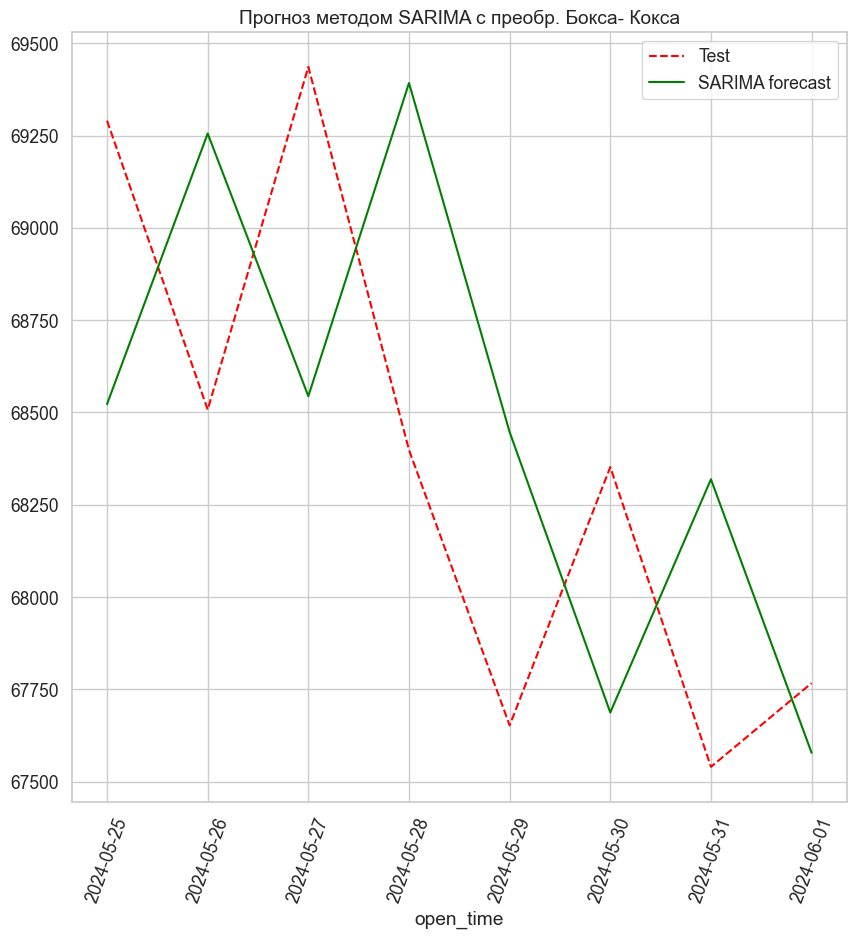

In [543]:
y_test.plot(style='--', color='red', title="Прогноз методом SARIMA с преобр. Бокса- Кокса", figsize=(10,10))
plt.plot(predictions, color='green', label = 'SARIMA forecast')
L = plt.legend()
L.get_texts()[0].set_text('Test')
plt.xticks(rotation=70)
plt.show()

Модели SARIMA на этих данных оказались все лучше наивного прогноза.  Немногим лучше результат  у модели с преобразованием Бокса-Кокса по метрике MAE/MAPE, чем у остальных моделей/данных